In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_theme(context='talk', style='darkgrid')

import plotly.graph_objects as go
import plotly.express as px
from plotly.colors import n_colors

In [2]:
#read the csv file 
life_expectancy_df = pd.read_csv('Life_Expectancy_Data.csv')

#preview
life_expectancy_df.head(10)

,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
5,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,16.7,102,66.0,9.20,66.0,0.1,553.328940,2883167.0,18.4,18.4,0.448,9.2
6,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,2861,16.2,106,63.0,9.42,63.0,0.1,445.893298,284331.0,18.6,18.7,0.434,8.9
7,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599,15.7,110,64.0,8.33,64.0,0.1,373.361116,2729431.0,18.8,18.9,0.433,8.7
8,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141,15.2,113,63.0,6.73,63.0,0.1,369.835796,26616792.0,19.0,19.1,0.415,8.4
9,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990,14.7,116,58.0,7.43,58.0,0.1,272.563770,2589345.0,19.2,19.3,0.405,8.1


# Exploratory Data Analysis

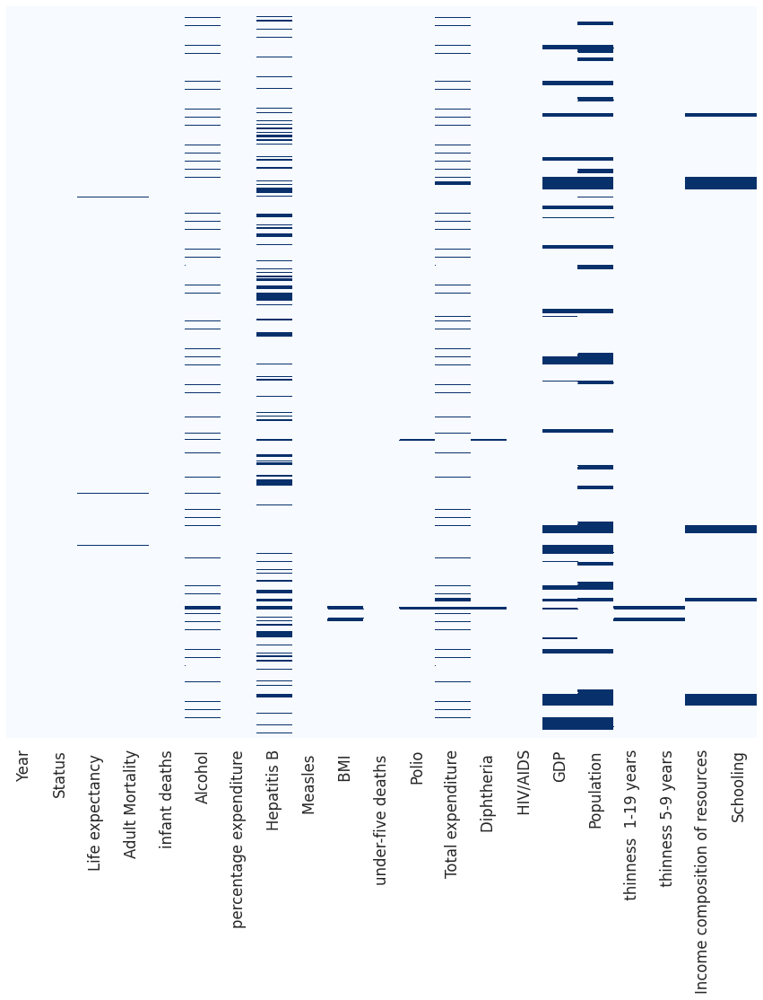

In [3]:
#check if there are any Null values
plt.figure(figsize=(15, 15))

#plot
sns.heatmap(life_expectancy_df.isnull(), yticklabels = False, cbar = False, cmap="Blues")

In [4]:
#lowercase
life_expectancy_df.columns = life_expectancy_df.columns.str.lower()

#replace white space with _
life_expectancy_df.columns = life_expectancy_df.columns.str.replace(' ', '_')

#rename columns
life_expectancy_df.rename({'life_expectancy_':'life_expectancy', 
                           'measles_':'measle', 
                           '_bmi_':'bmi', 
                           'under-five_deaths':'under_five_deaths',
                           'diphtheria_':'diphtheria',
                           '_hiv/aids': 'hiv/aids',
                           '_thinness__1-19_years':'thinness_1_to_19_years',
                           '_thinness_5-9_years':'thinness_5_to_9_years'}, axis=1, inplace=True) 

In [61]:
life_expectancy_df.to_csv('life_expectancy_df.csv')

In [5]:
#data info
life_expectancy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   year                             2938 non-null   int64  
 1   status                           2938 non-null   object 
 2   life_expectancy                  2928 non-null   float64
 3   adult_mortality                  2928 non-null   float64
 4   infant_deaths                    2938 non-null   int64  
 5   alcohol                          2744 non-null   float64
 6   percentage_expenditure           2938 non-null   float64
 7   hepatitis_b                      2385 non-null   float64
 8   measle                           2938 non-null   int64  
 9   bmi                              2904 non-null   float64
 10  under-five_deaths_               2938 non-null   int64  
 11  polio                            2919 non-null   float64
 12  total_expenditure   

In [6]:
#statistical summary 
life_expectancy_df.describe()

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measle,bmi,under-five_deaths_,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_to_19_years,thinness_5_to_9_years,income_composition_of_resources,schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


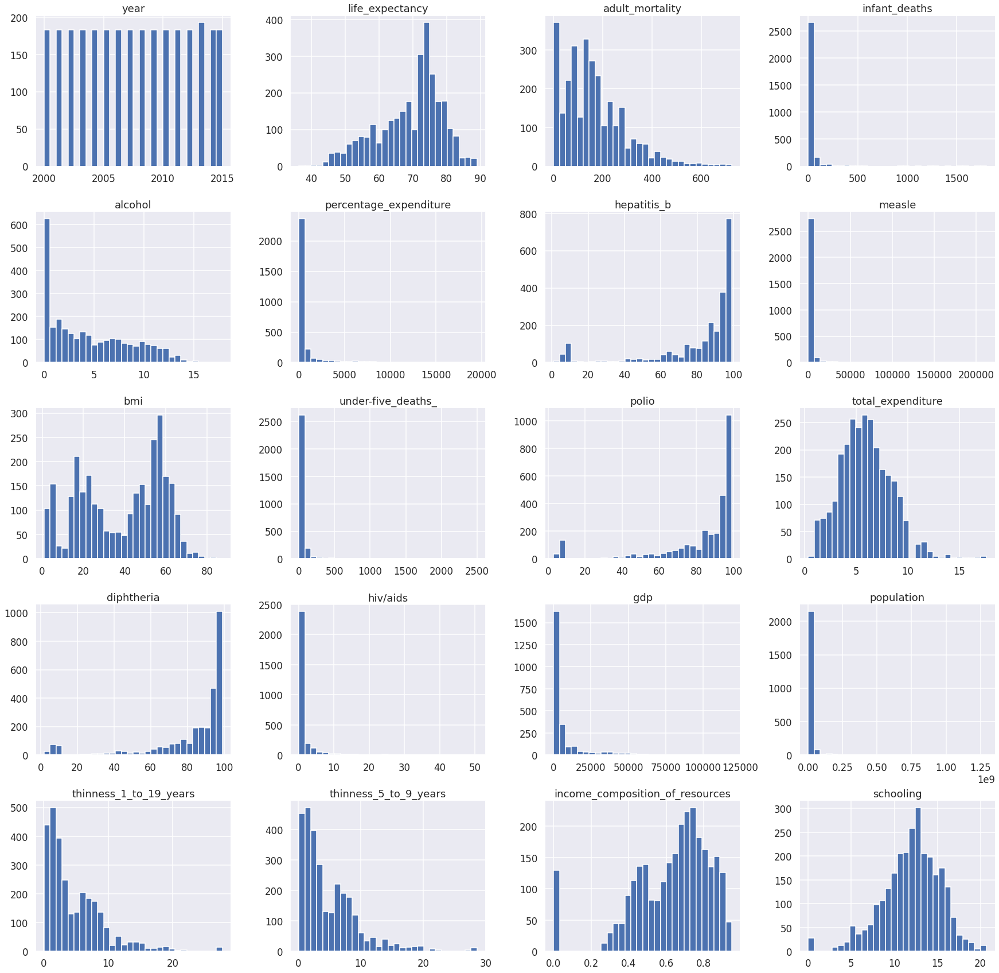

In [7]:
#plot the histogram
life_expectancy_df.hist(bins = 30, figsize = (30, 30));

In [9]:
#checking the unique values in country to consider it as a categorical variable
life_expectancy_df['status'].nunique()

2

In [10]:
#perform one-hot encoding
life_expectancy_df = pd.get_dummies(life_expectancy_df, columns = ['status'])

In [11]:
life_expectancy_df

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measle,bmi,under-five_deaths_,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_to_19_years,thinness_5_to_9_years,income_composition_of_resources,schooling,status_Developed,status_Developing
0,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,0,1
1,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,0,1
2,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,0,1
3,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,0,1
4,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2,0,1
2934,2003,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5,0,1
2935,2002,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0,0,1
2936,2001,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8,0,1


In [12]:
#check the number of null values for the columns having null values
life_expectancy_df.isnull().sum()[np.where(life_expectancy_df.isnull().sum() != 0)[0]]


life_expectancy                     10
adult_mortality                     10
alcohol                            194
hepatitis_b                        553
bmi                                 34
polio                               19
total_expenditure                  226
diphtheria                          19
gdp                                448
population                         652
thinness_1_to_19_years              34
thinness_5_to_9_years               34
income_composition_of_resources    167
schooling                          163
dtype: int64

In [13]:
#since most of the are continous values we fill them with mean
life_expectancy_df = life_expectancy_df.apply(lambda x: x.fillna(x.mean()),axis=0)

In [14]:
life_expectancy_df.isnull().sum()[np.where(life_expectancy_df.isnull().sum() != 0)[0]]

Series([], dtype: int64)

# Data Visualization

In [15]:
!pip install dataprep
from dataprep.eda import create_report

     |████████████████████████████████| 1.8 MB 7.4 MB/s 
     |████████████████████████████████| 848 kB 47.4 MB/s 
     |████████████████████████████████| 10.1 MB 36.9 MB/s 
     |████████████████████████████████| 719 kB 36.0 MB/s 
     |████████████████████████████████| 63 kB 2.3 MB/s 
     |████████████████████████████████| 1.3 MB 29.1 MB/s 
     |████████████████████████████████| 366 kB 75.1 MB/s 
     |████████████████████████████████| 50 kB 6.0 MB/s 
     |████████████████████████████████| 1.5 MB 26.0 MB/s 
     |████████████████████████████████| 294 kB 51.3 MB/s 
     |████████████████████████████████| 160 kB 51.4 MB/s 
     |████████████████████████████████| 125 kB 53.1 MB/s 
     |████████████████████████████████| 49 kB 4.3 MB/s 
     |████████████████████████████████| 743 kB 59.2 MB/s 
  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13919 sha256=56e309f854e9fe0225f41816ad10382414517e6372381a376f961ac6b03f9dd3
  Stored in directory: /root/.cache/pip/

My Report
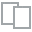
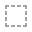
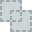
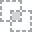
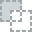
...
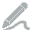
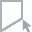
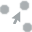
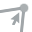
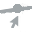

In [64]:
#create report
report = create_report(life_expectancy_df, title='My Report')
report

In [17]:
life_expectancy_df.columns

Index(['year', 'life_expectancy', 'adult_mortality', 'infant_deaths',
       'alcohol', 'percentage_expenditure', 'hepatitis_b', 'measle', 'bmi',
       'under-five_deaths_', 'polio', 'total_expenditure', 'diphtheria',
       'hiv/aids', 'gdp', 'population', 'thinness_1_to_19_years',
       'thinness_5_to_9_years', 'income_composition_of_resources', 'schooling',
       'status_Developed', 'status_Developing'],
      dtype='object')

In [18]:
col_dict = {'life_expectancy':1,
            'year':2,
            'adult_mortality':3, 
            'infant_deaths':4,
            'alcohol':5, 
            'percentage_expenditure':6, 
            'hepatitis_b':7, 
            'measle':8, 
            'bmi':9,
            'under-five_deaths_':10, 
            'polio':11, 
            'total_expenditure':12, 
            'diphtheria':13,
            'hiv/aids':14, 
            'gdp':15, 
            'population':16, 
            'thinness_1_to_19_years':17,
            'thinness_5_to_9_years':18, 
            'income_composition_of_resources':19, 
            'schooling':20,
            'status_Developed':21, 
            'status_Developing':22}

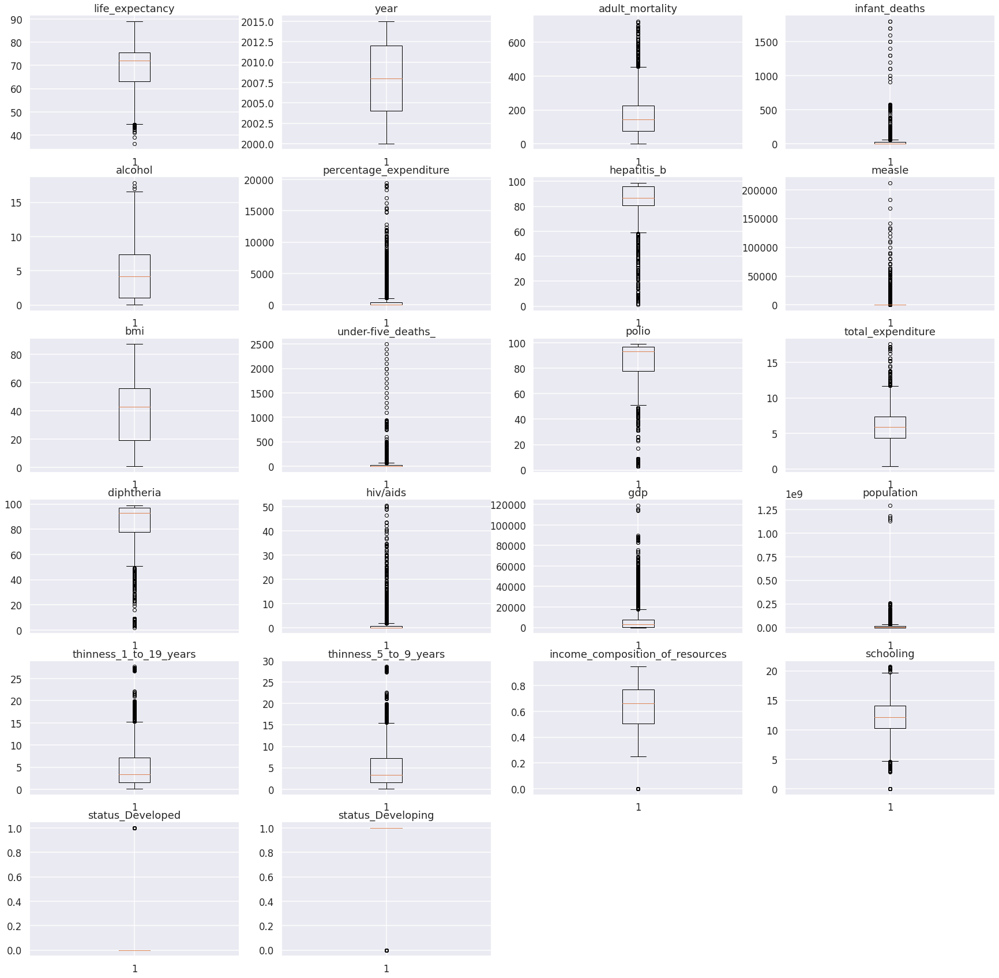

In [19]:
plt.figure(figsize=(30, 30))

for variable,i in col_dict.items():
                     plt.subplot(6,4,i)
                     plt.boxplot(life_expectancy_df[variable],whis=1.5)
                     plt.title(variable)

plt.show()

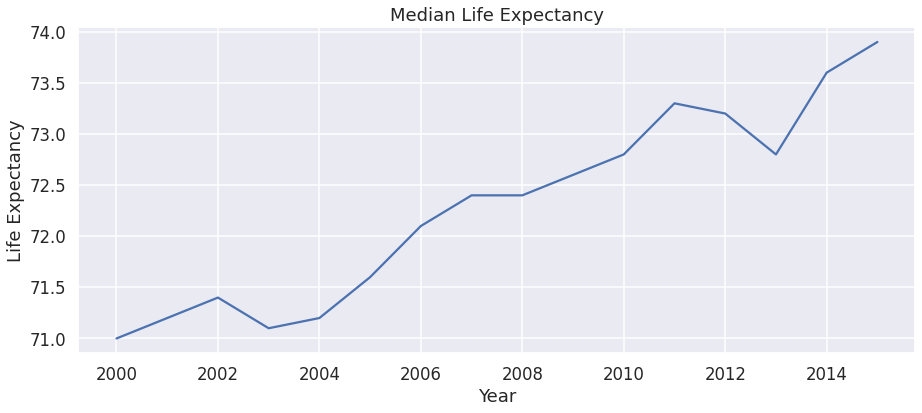

In [20]:
#lineplot
fig = plt.figure(figsize=(15, 6))
sns.lineplot(data=life_expectancy_df.groupby('year').median(), x='year', y='life_expectancy')
plt.title('Median Life Expectancy')
plt.xlabel('Year')
plt.ylabel('Life Expectancy');

# AutoML

In [21]:
!pip install h2o
import h2o
from h2o.automl import H2OAutoML

     |████████████████████████████████| 175.8 MB 33 kB/s 
  Created wheel for h2o: filename=h2o-3.34.0.1-py2.py3-none-any.whl size=175823552 sha256=f35d2ef9b0abdcb8702757a1ccad454dd625d5cb7615fe1347484d1c5dc77080
  Stored in directory: /root/.cache/pip/wheels/5c/7b/60/014a2b6d009793271276a9a41cb954659c8f23b8823ca21625
Successfully built h2o


In [22]:
#initiate
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.11" 2021-04-20; OpenJDK Runtime Environment (build 11.0.11+9-Ubuntu-0ubuntu2.18.04); OpenJDK 64-Bit Server VM (build 11.0.11+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp8yirz2ar
  JVM stdout: /tmp/tmp8yirz2ar/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp8yirz2ar/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_ijitwl
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [23]:
#convert pandas df into h2o frame
h2o_df = h2o.H2OFrame(life_expectancy_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [24]:
#preview
h2o_df

year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measle,bmi,under-five_deaths_,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_to_19_years,thinness_5_to_9_years,income_composition_of_resources,schooling,status_Developed,status_Developing
2015,65,263,62,0.01,71.2796,65,1154,19.1,83,6,8.16,65,0.1,584.259,3.37365e+07,17.2,17.3,0.479,10.1,0,1
2014,59.9,271,64,0.01,73.5236,62,492,18.6,86,58,8.18,62,0.1,612.697,327582,17.5,17.5,0.476,10,0,1
2013,59.9,268,66,0.01,73.2192,64,430,18.1,89,62,8.13,64,0.1,631.745,3.17317e+07,17.7,17.7,0.47,9.9,0,1
2012,59.5,272,69,0.01,78.1842,67,2787,17.6,93,67,8.52,67,0.1,669.959,3.69696e+06,17.9,18,0.463,9.8,0,1
2011,59.2,275,71,0.01,7.09711,68,3013,17.2,97,68,7.87,68,0.1,63.5372,2.9786e+06,18.2,18.2,0.454,9.5,0,1
2010,58.8,279,74,0.01,79.6794,66,1989,16.7,102,66,9.2,66,0.1,553.329,2.88317e+06,18.4,18.4,0.448,9.2,0,1
2009,58.6,281,77,0.01,56.7622,63,2861,16.2,106,63,9.42,63,0.1,445.893,284331,18.6,18.7,0.434,8.9,0,1
2008,58.1,287,80,0.03,25.8739,64,1599,15.7,110,64,8.33,64,0.1,373.361,2.72943e+06,18.8,18.9,0.433,8.7,0,1
2007,57.5,295,82,0.02,10.9102,63,1141,15.2,113,63,6.73,63,0.1,369.836,2.66168e+07,19,19.1,0.415,8.4,0,1
2006,57.3,295,84,0.03,17.1715,64,1990,14.7,116,58,7.43,58,0.1,272.564,2.58934e+06,19.2,19.3,0.405,8.1,0,1


In [25]:
#statistics
h2o_df.describe()

Rows:2938
Cols:22




,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measle,bmi,under-five_deaths_,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_to_19_years,thinness_5_to_9_years,income_composition_of_resources,schooling,status_Developed,status_Developing
type,int,real,real,int,real,real,real,int,real,int,real,real,real,real,real,real,real,real,real,real,int,int
mins,2000.0,36.3,1.0,0.0,0.01,0.0,1.0,0.0,1.0,0.0,3.0,0.37,2.0,0.1,1.68135,34.0,0.1,0.1,0.0,0.0,0.0,0.0
mean,2007.5187202178383,69.22493169398913,164.79644808743183,30.303948264125278,4.602860787172021,738.2512954533839,80.94046121593293,2419.5922396187866,38.32124655647391,42.03573859768562,82.5501884206924,5.938189528023588,82.3240835902707,1.7421034717494872,7483.158469138469,12753375.120052474,4.8397038567493045,4.87031680440772,0.6275510645976173,11.992792792792752,0.17426820966643974,0.8257317903335603
maxs,2015.0,89.0,723.0,1800.0,17.87,19479.91161,99.0,212183.0,87.3,2500.0,99.0,17.6,99.0,50.6,119172.7418,1293859294.0,27.7,28.6,0.948,20.7,1.0,1.0
sigma,4.613840940258099,9.50764006508436,124.08030158087858,117.92650131339906,3.9162877471349185,1987.9148580161939,22.586854610352322,11467.27248923461,19.92767651140397,160.4455484057337,23.35214279608329,2.4002738473449368,23.640073034773234,5.077784531086546,13136.80041731807,53815462.556939155,4.394535411885802,4.482707716786458,0.20481974064387873,3.2643812850122087,0.3794045280851151,0.3794045280851151
zeros,0,0,0,848,0,611,0,983,0,785,0,0,0,0,0,0,0,0,130,28,2426,512
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,2015.0,65.0,263.0,62.0,0.01,71.27962362,65.0,1154.0,19.1,83.0,6.0,8.16,65.0,0.1,584.2592099999998,33736494.0,17.2,17.3,0.479,10.1,0.0,1.0
1,2014.0,59.9,271.0,64.0,0.01,73.52358168,62.0,492.0,18.6,86.0,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,0.0,1.0
2,2013.0,59.9,268.0,66.0,0.01,73.21924272,64.0,430.0,18.1,89.0,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.47,9.9,0.0,1.0


## Train Test Split

In [26]:
#split train and test sets
train, test = h2o_df.split_frame(ratios=[.75])


In [27]:
#define X and y
X = train.columns
y = 'life_expectancy'
X.remove(y)

In [28]:
X

['year',
 'adult_mortality',
 'infant_deaths',
 'alcohol',
 'percentage_expenditure',
 'hepatitis_b',
 'measle',
 'bmi',
 'under-five_deaths_',
 'polio',
 'total_expenditure',
 'diphtheria',
 'hiv/aids',
 'gdp',
 'population',
 'thinness_1_to_19_years',
 'thinness_5_to_9_years',
 'income_composition_of_resources',
 'schooling',
 'status_Developed',
 'status_Developing']

In [29]:
y

'life_expectancy'

## Train

In [30]:
#initiate
aml = H2OAutoML(balance_classes=True,
                stopping_metric='RMSE',     #for regression
                seed=121,
                max_models=10)

#train
aml.train(x=X, 
          y=y, 
          training_frame=train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_3_AutoML_1_20211005_84408

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.5545530802744565
RMSE: 0.7446832079981772
MAE: 0.46840468720844725
RMSLE: 0.01104417003559826
R^2: 0.99386266582015
Mean Residual Deviance: 0.5545530802744565
Null degrees of freedom: 2209
Residual degrees of freedom: 2206
Null deviance: 199689.68146314585
Residual deviance: 1225.5623074065488
AIC: 4978.708338382731

ModelMetricsRegressionGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 3.084315042532255
RMSE: 1.7562218090355943
MAE: 1.1035150557582567
RMSLE: 0.02671687044318177
R^2: 0.9658653557156639
Mean Residual Deviance: 3.084315042532255
Null degrees of freedom: 2209
Residual degrees of freedom: 2206
Null deviance: 199936.460912

# Leaderboard Exploration

In [31]:
#leaderboard
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_BestOfFamily_3_AutoML_1_20211005_84408,3.08432,1.75622,3.08432,1.10352,0.0267169
StackedEnsemble_AllModels_2_AutoML_1_20211005_84408,3.08449,1.75627,3.08449,1.10356,0.0267173
StackedEnsemble_AllModels_1_AutoML_1_20211005_84408,3.08781,1.75722,3.08781,1.10356,0.0267438
StackedEnsemble_BestOfFamily_2_AutoML_1_20211005_84408,3.09266,1.75859,3.09266,1.10421,0.0267688
GBM_4_AutoML_1_20211005_84408,3.1012,1.76102,3.1012,1.10467,0.0268132
GBM_3_AutoML_1_20211005_84408,3.17481,1.7818,3.17481,1.13708,0.0274067
GBM_2_AutoML_1_20211005_84408,3.30044,1.81671,3.30044,1.17186,0.0278368
XRT_1_AutoML_1_20211005_84408,3.40462,1.84516,3.40462,1.1415,0.0288267
DRF_1_AutoML_1_20211005_84408,3.50437,1.872,3.50437,1.16662,0.0292889
XGBoost_3_AutoML_1_20211005_84408,3.97667,1.99416,3.97667,1.36732,0.0303664


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_3_AutoML_1_20211005_84408,3.08432,1.75622,3.08432,1.10352,0.0267169,367,0.062079,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20211005_84408,3.08449,1.75627,3.08449,1.10356,0.0267173,476,0.09769,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20211005_84408,3.08781,1.75722,3.08781,1.10356,0.0267438,397,0.073568,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20211005_84408,3.09266,1.75859,3.09266,1.10421,0.0267688,330,0.072544,StackedEnsemble
GBM_4_AutoML_1_20211005_84408,3.1012,1.76102,3.1012,1.10467,0.0268132,1301,0.030794,GBM
GBM_3_AutoML_1_20211005_84408,3.17481,1.7818,3.17481,1.13708,0.0274067,1082,0.026279,GBM
GBM_2_AutoML_1_20211005_84408,3.30044,1.81671,3.30044,1.17186,0.0278368,1010,0.025129,GBM
XRT_1_AutoML_1_20211005_84408,3.40462,1.84516,3.40462,1.1415,0.0288267,4410,0.026906,DRF
DRF_1_AutoML_1_20211005_84408,3.50437,1.872,3.50437,1.16662,0.0292889,3274,0.025542,DRF
XGBoost_3_AutoML_1_20211005_84408,3.97667,1.99416,3.97667,1.36732,0.0303664,580,0.005901,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

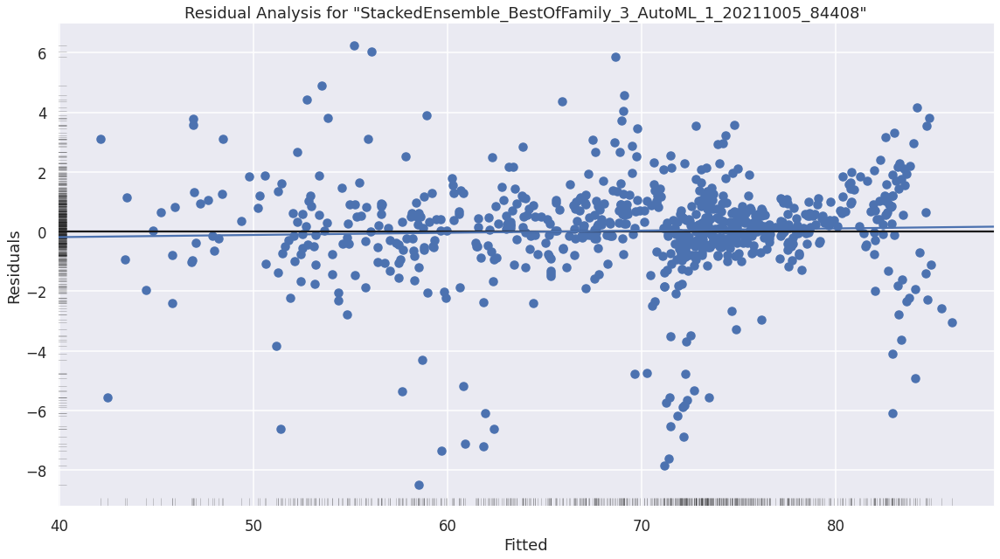

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

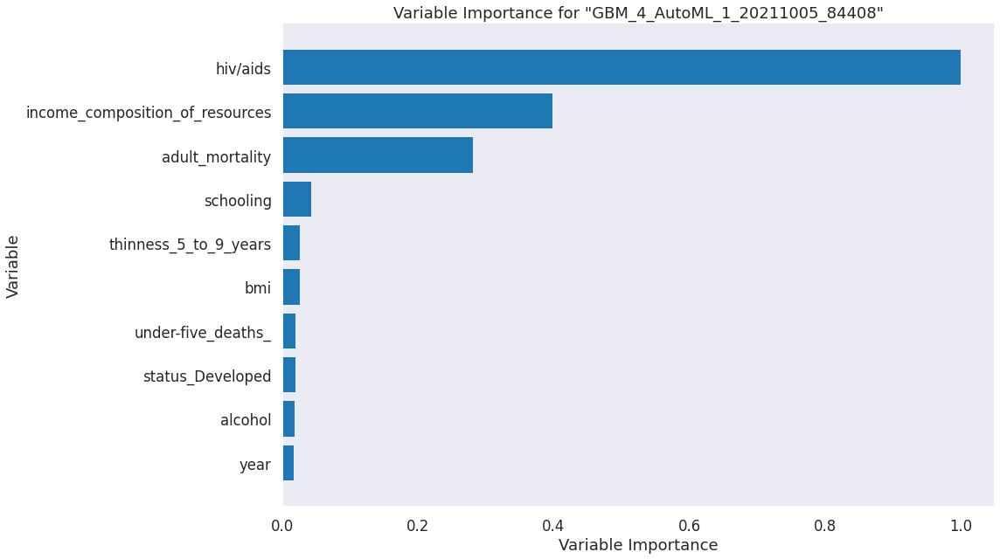

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

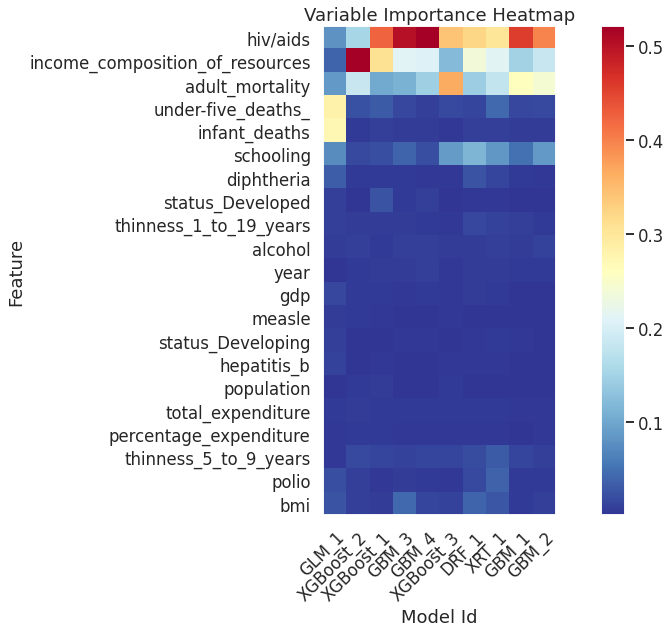

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

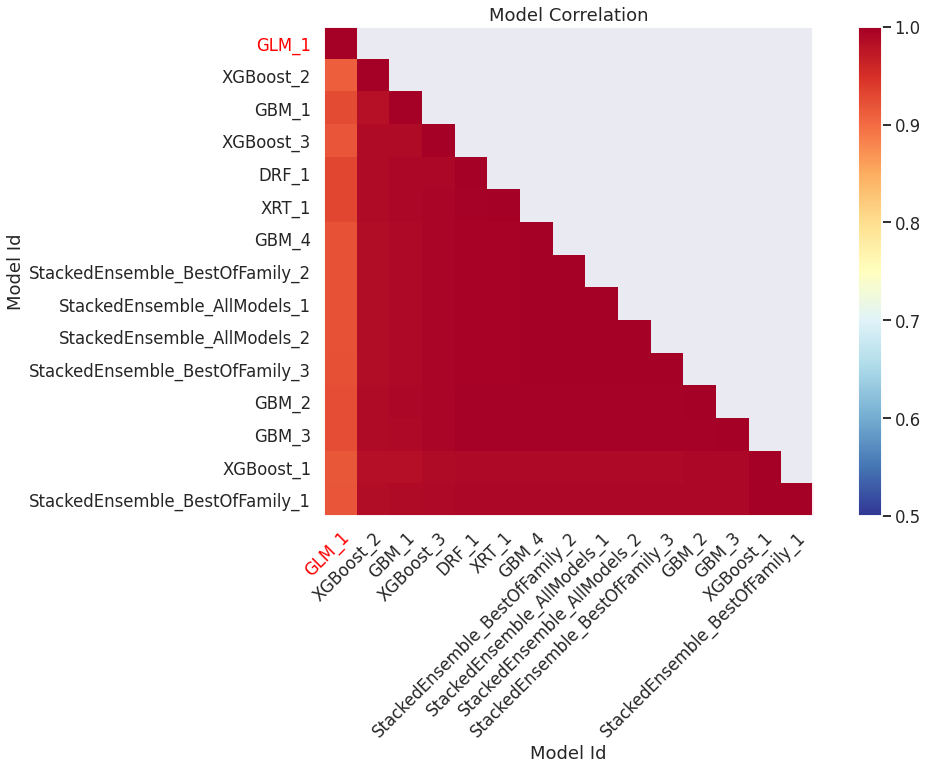

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

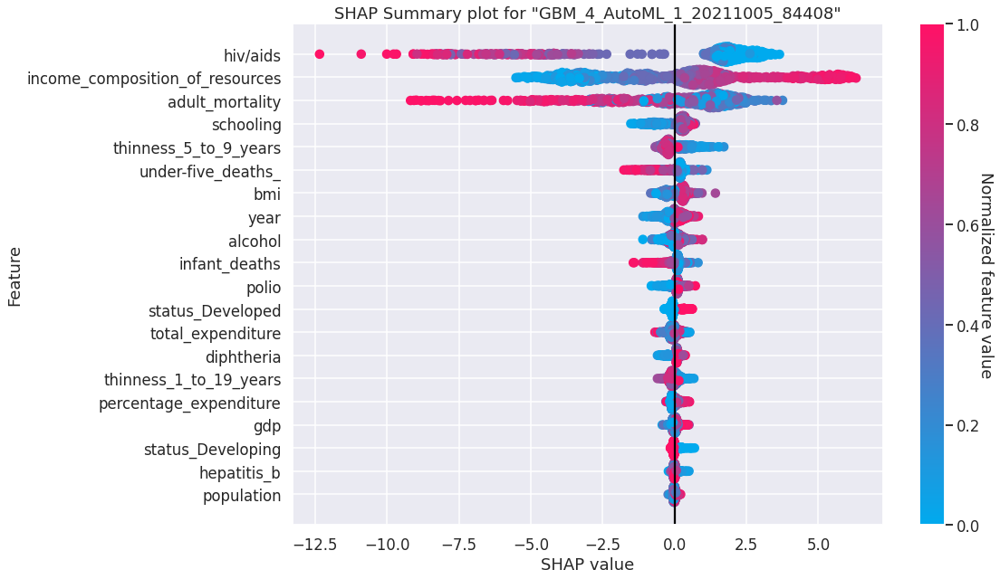

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

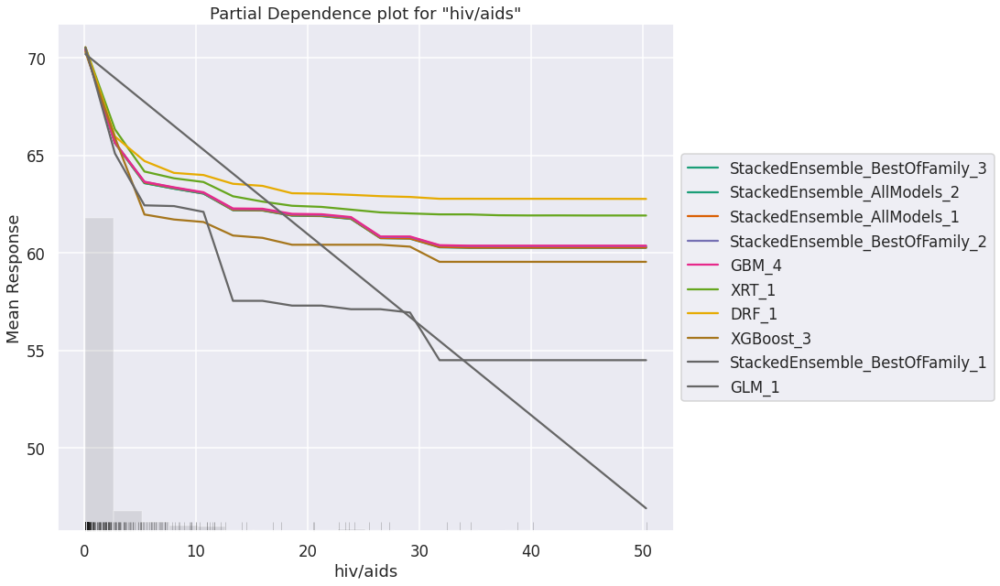

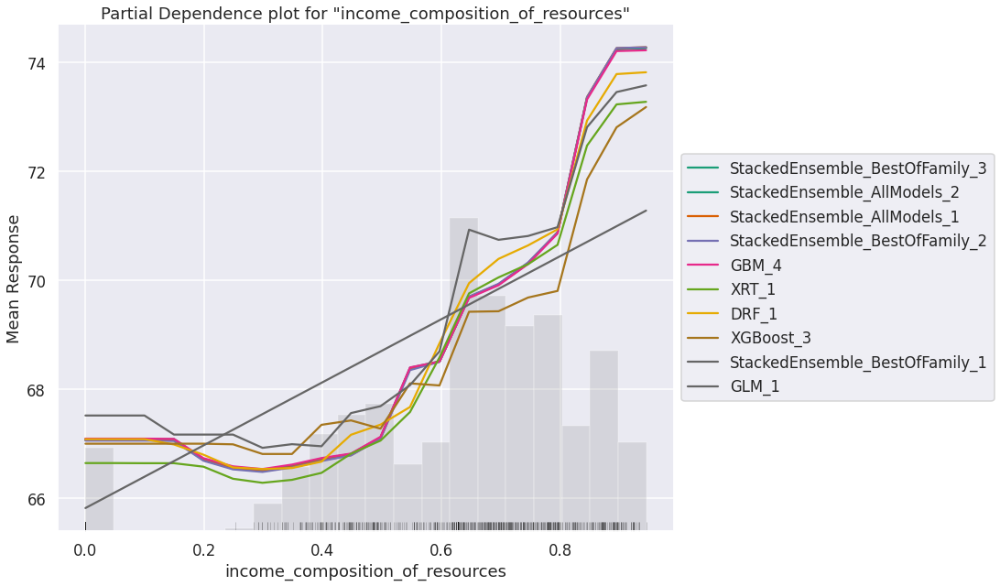

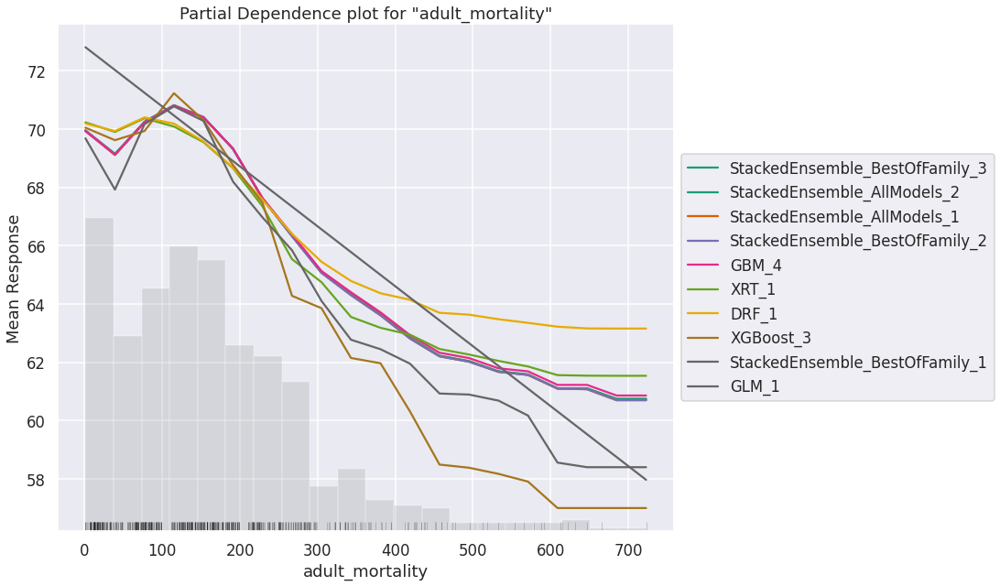

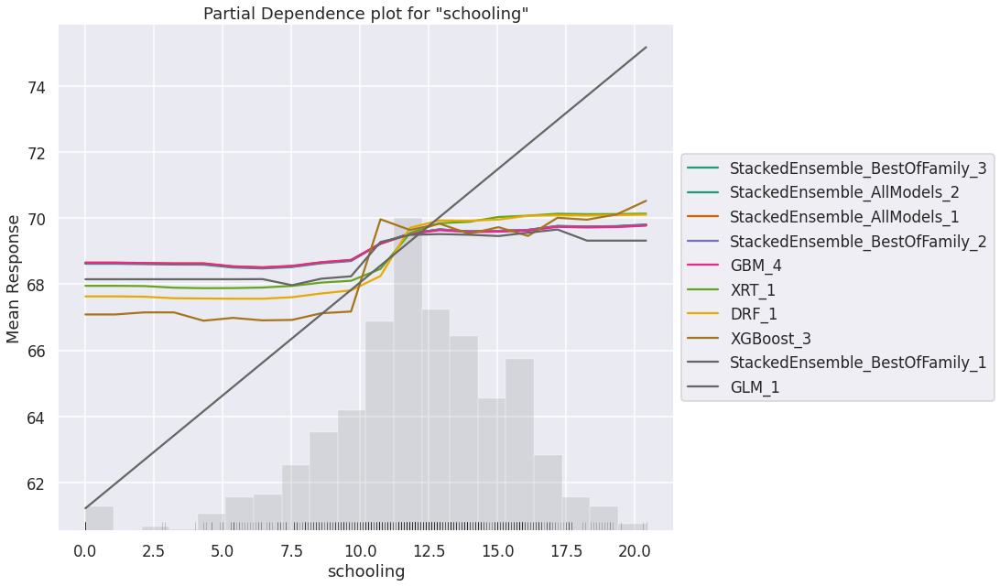

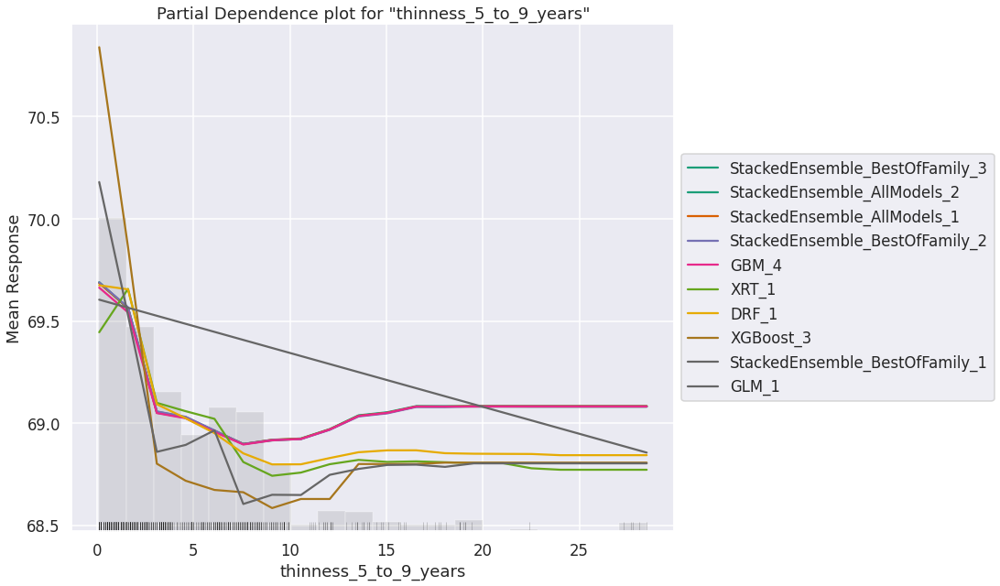

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

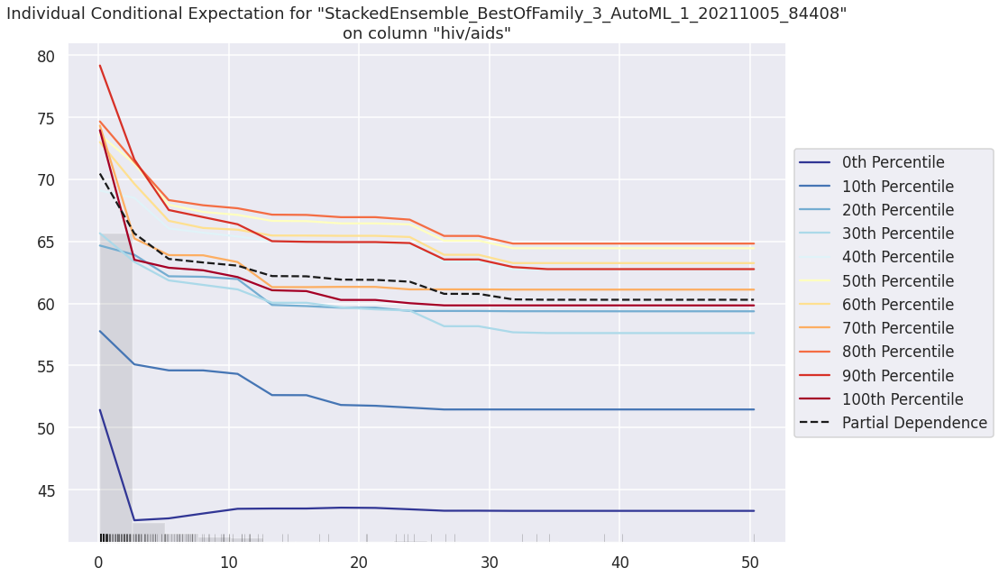

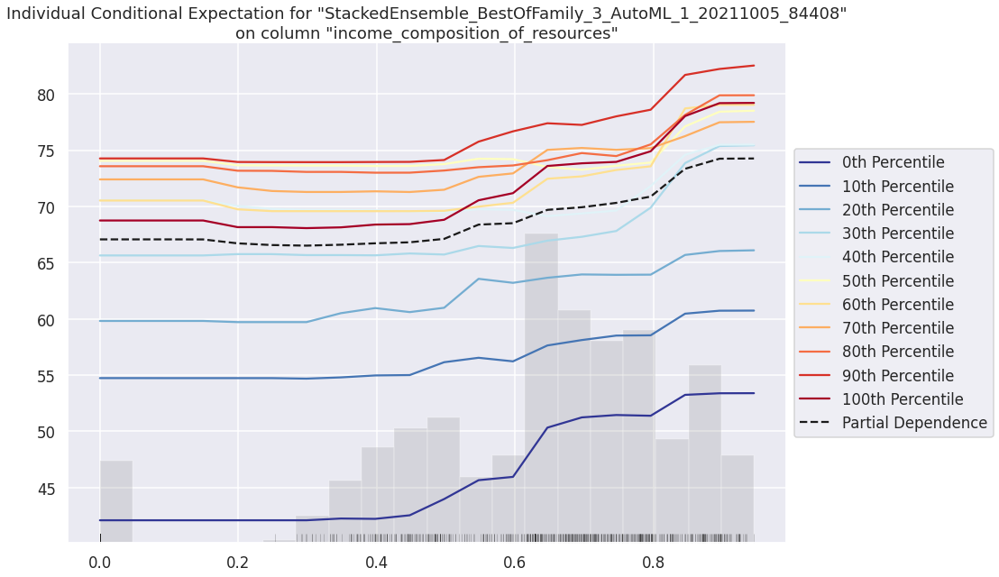

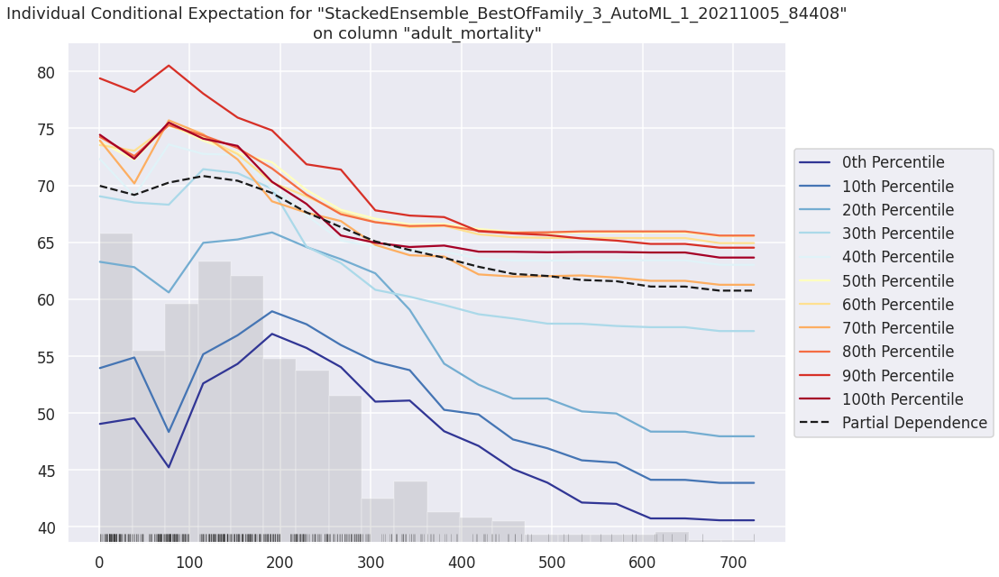

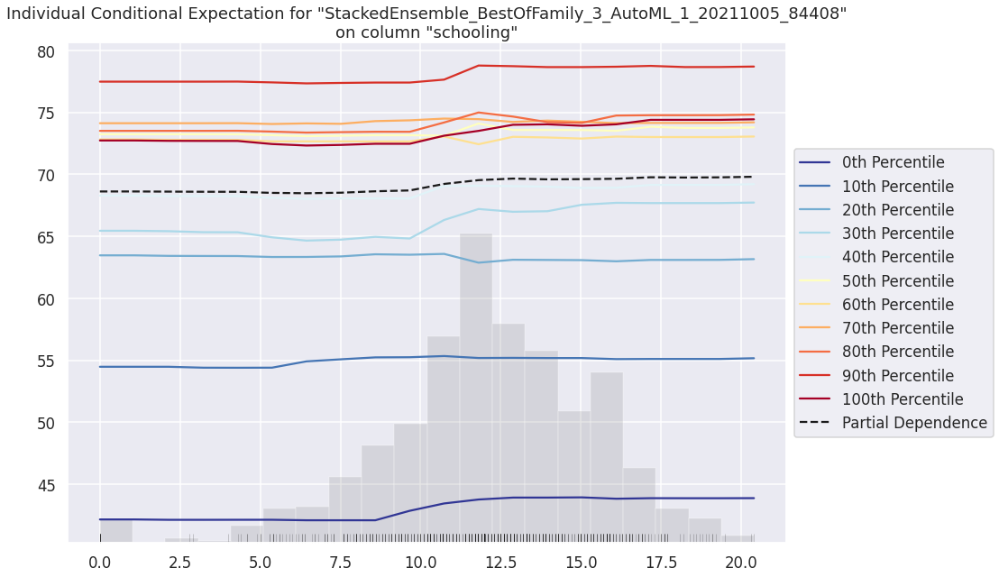

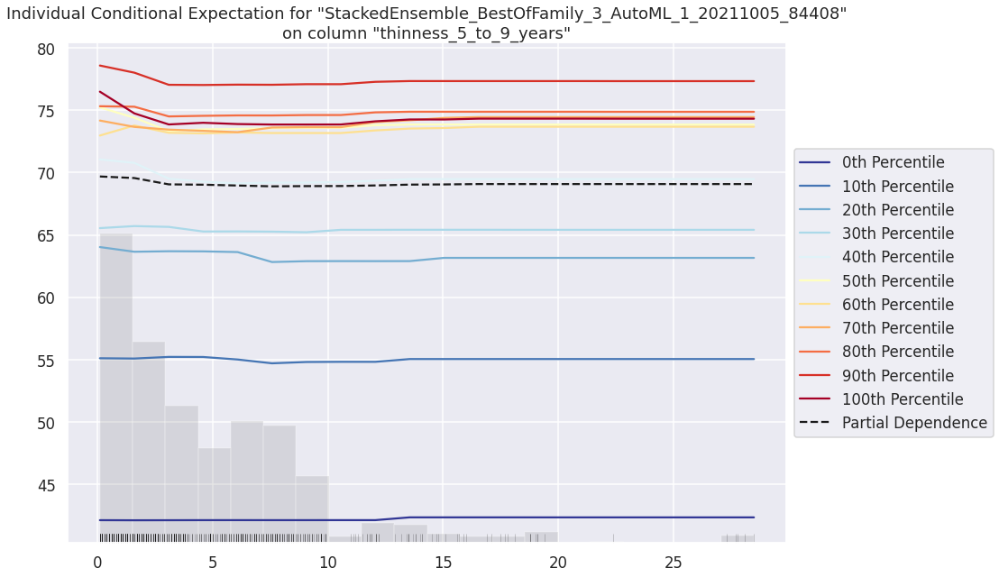

In [32]:
#compare all models
exm = aml.explain(test)

# Stacked Ensemble Exploration

In [33]:
#look at best model
se = aml.leader
metalearner = h2o.get_model(se.metalearner()['name'])

#look at important variables
metalearner.varimp()

/usr/local/lib/python3.7/dist-packages/h2o/estimators/stackedensemble.py:929: H2ODeprecationWarning:

The usage of stacked_ensemble.metalearner()['name'] will be deprecated. Metalearner now returns the metalearner object. If you need to get the 'name' please use stacked_ensemble.metalearner().model_id



[('GBM_4_AutoML_1_20211005_84408', 9.057518005371094, 1.0, 0.9669489837070229),
 ('XRT_1_AutoML_1_20211005_84408',
  0.19638332724571228,
  0.02168180368278123,
  0.020965198036000495),
 ('XGBoost_3_AutoML_1_20211005_84408',
  0.11320919543504715,
  0.012498920274617647,
  0.012085818256976636),
 ('DRF_1_AutoML_1_20211005_84408', 0.0, 0.0, 0.0),
 ('GLM_1_AutoML_1_20211005_84408', 0.0, 0.0, 0.0)]

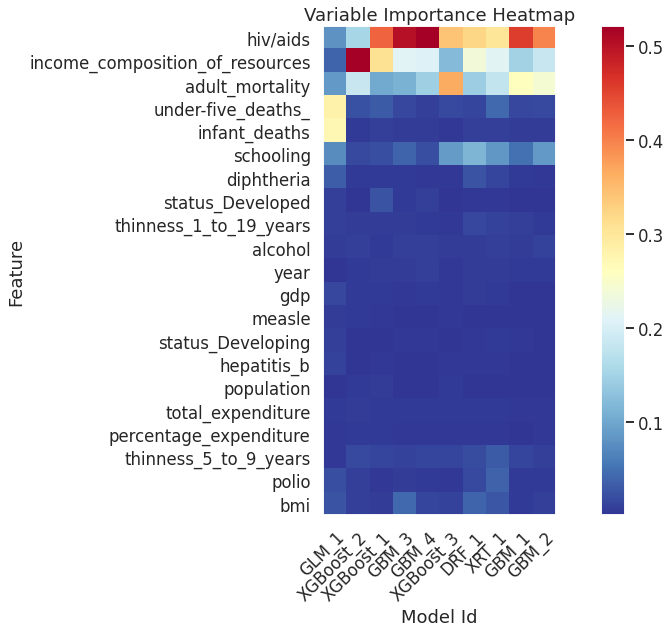

In [34]:
#variable importance heatmap
va_plot = aml.varimp_heatmap()

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

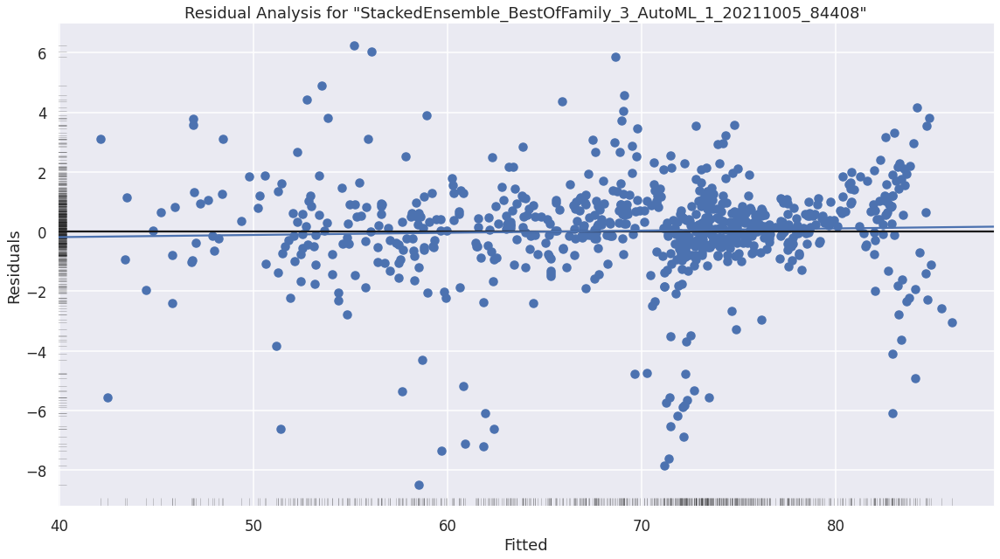

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

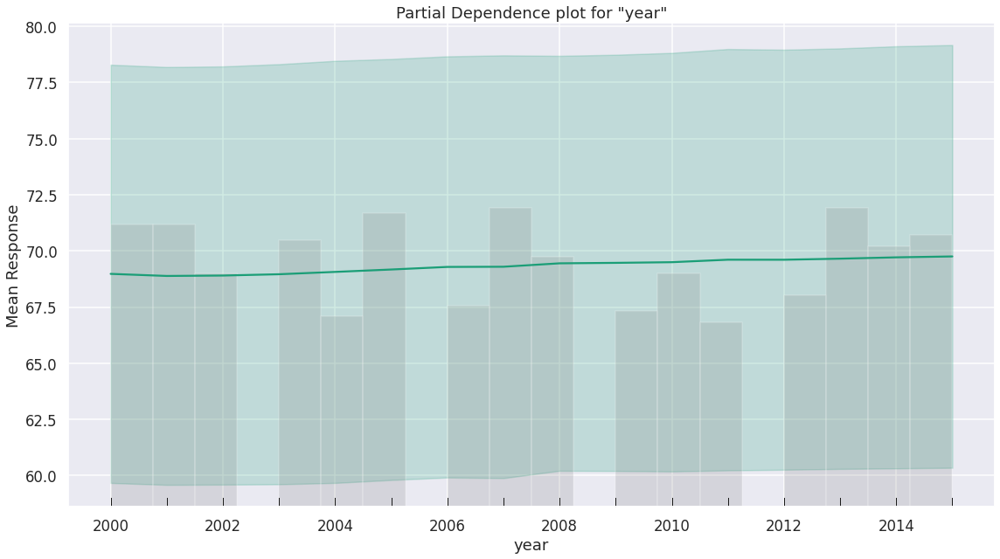

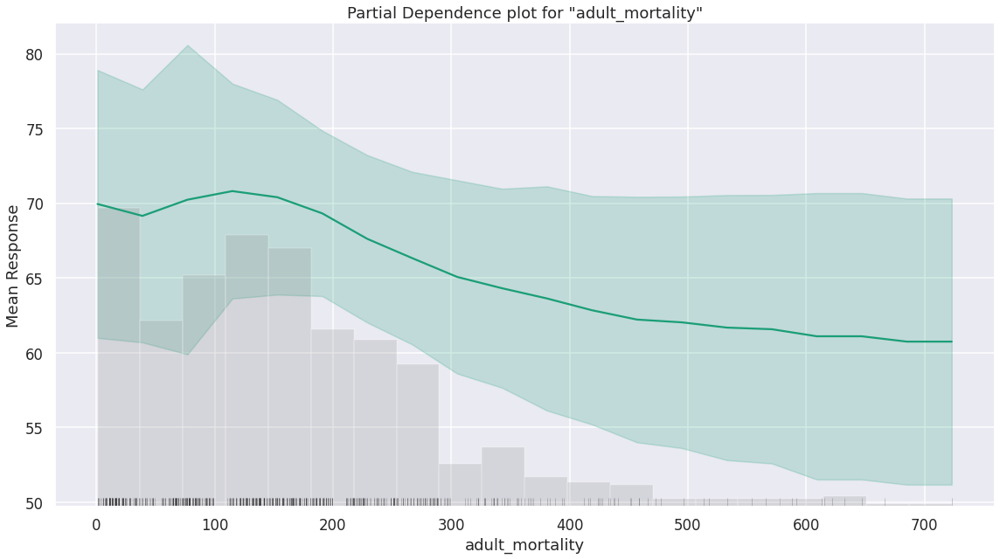

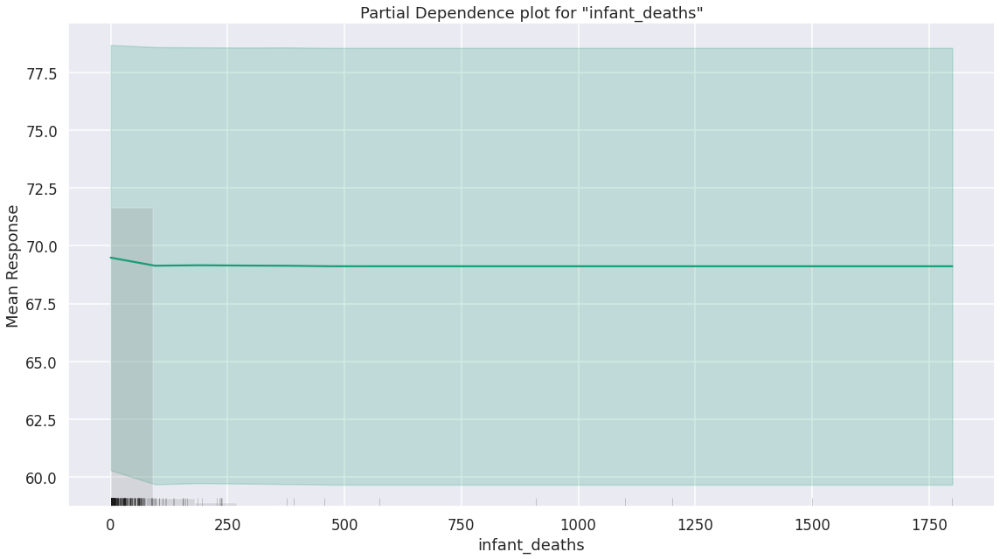

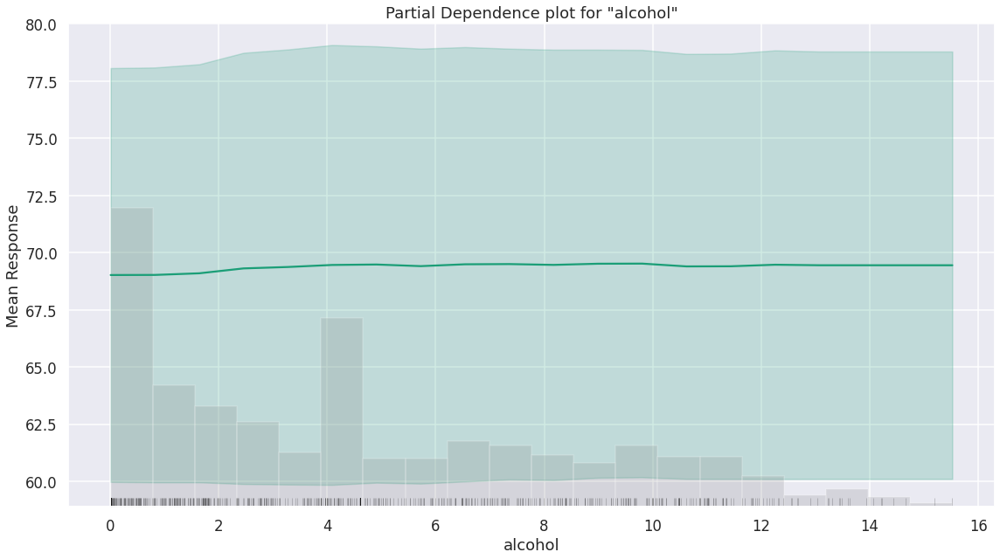

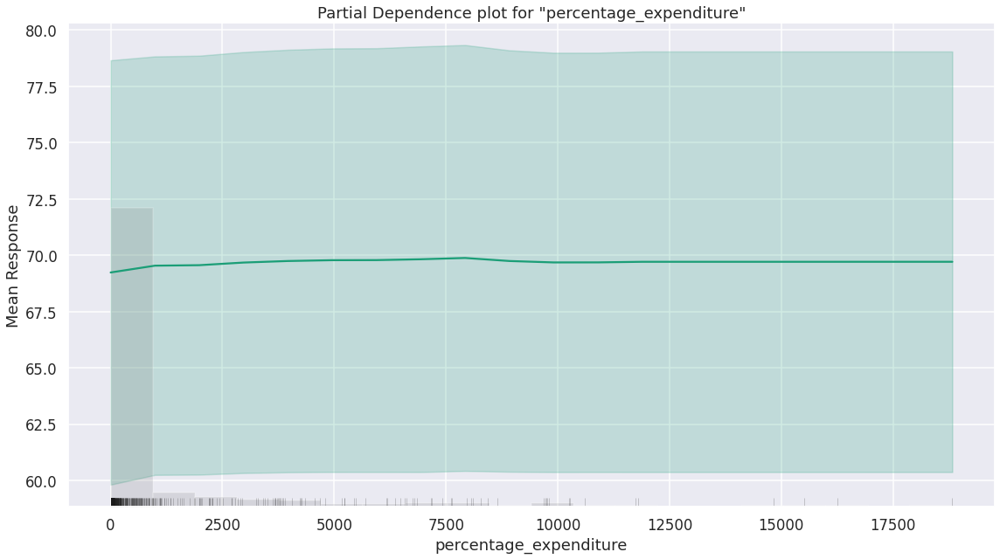

...

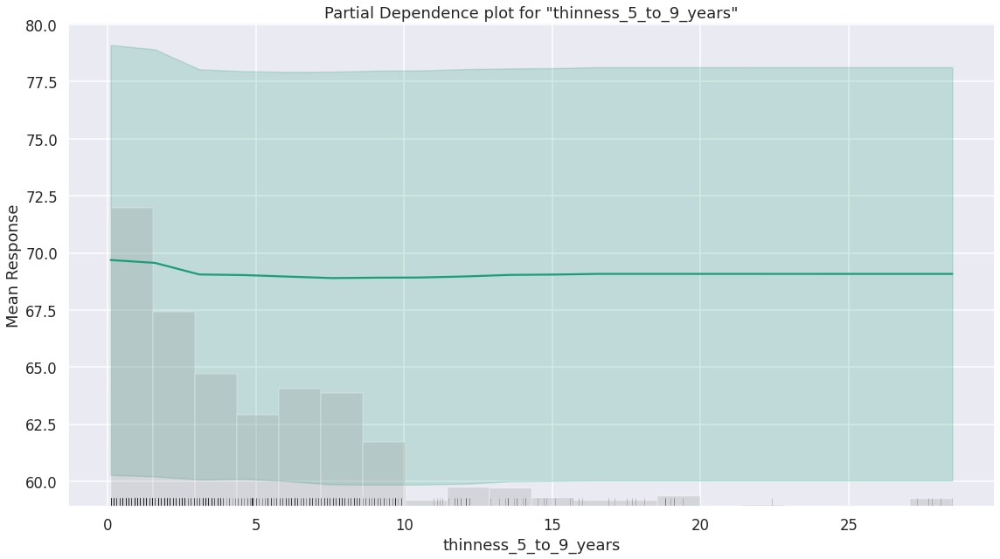

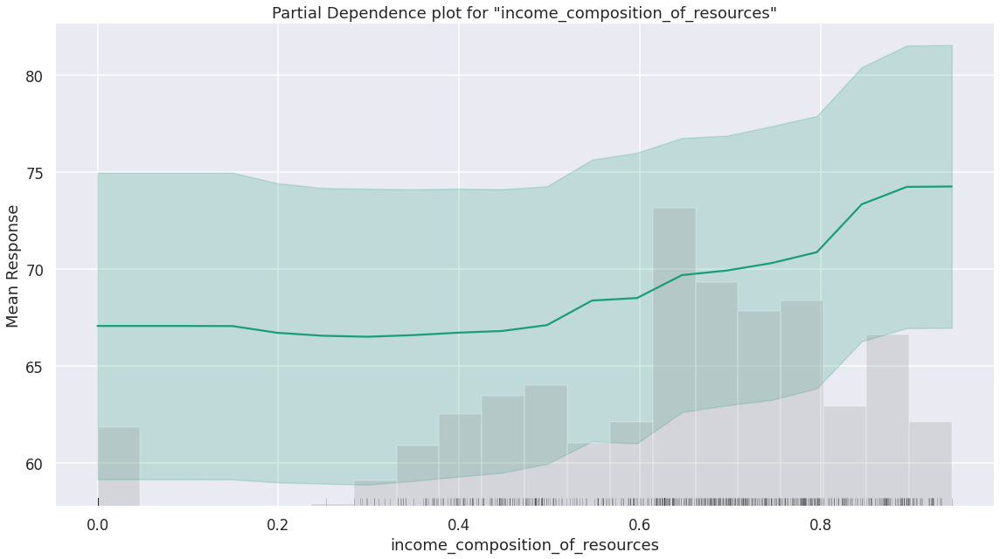

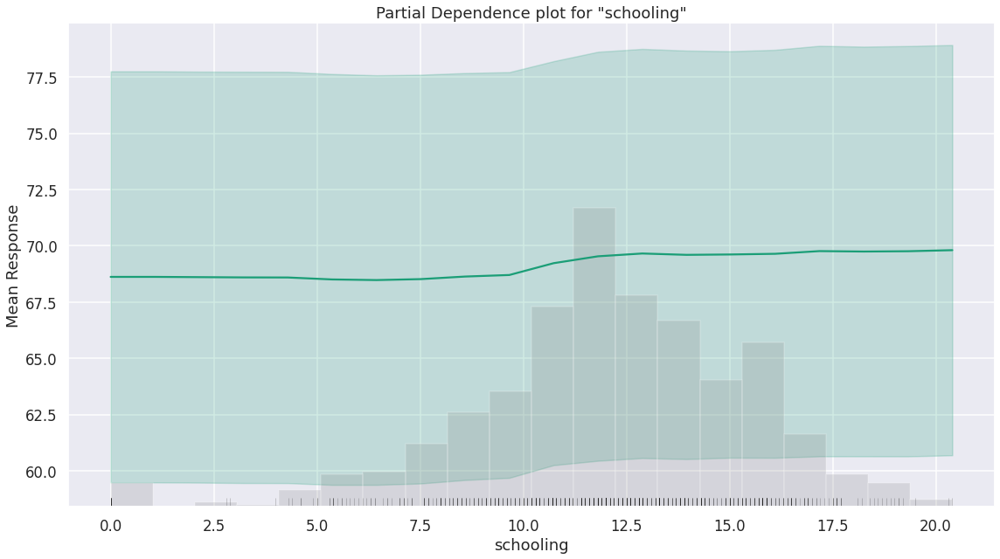

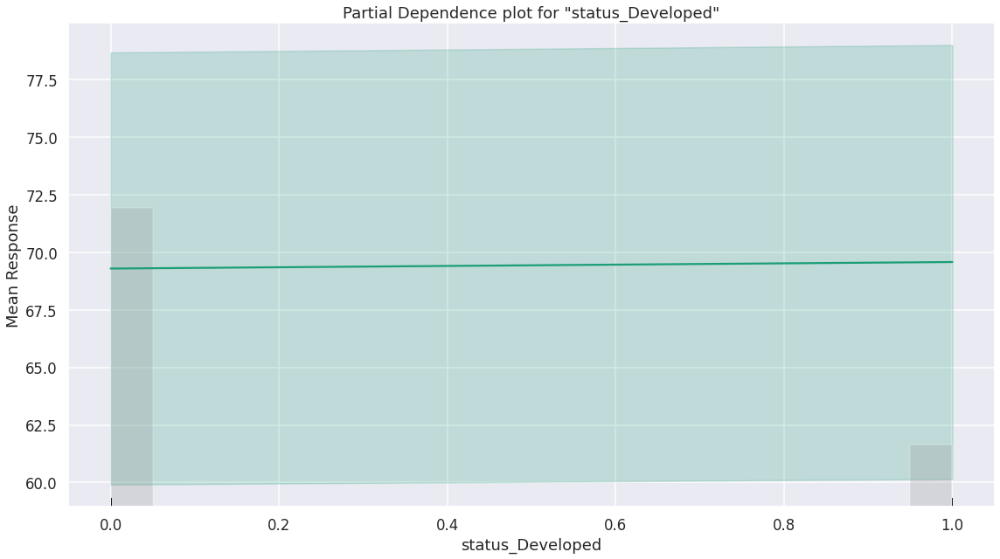

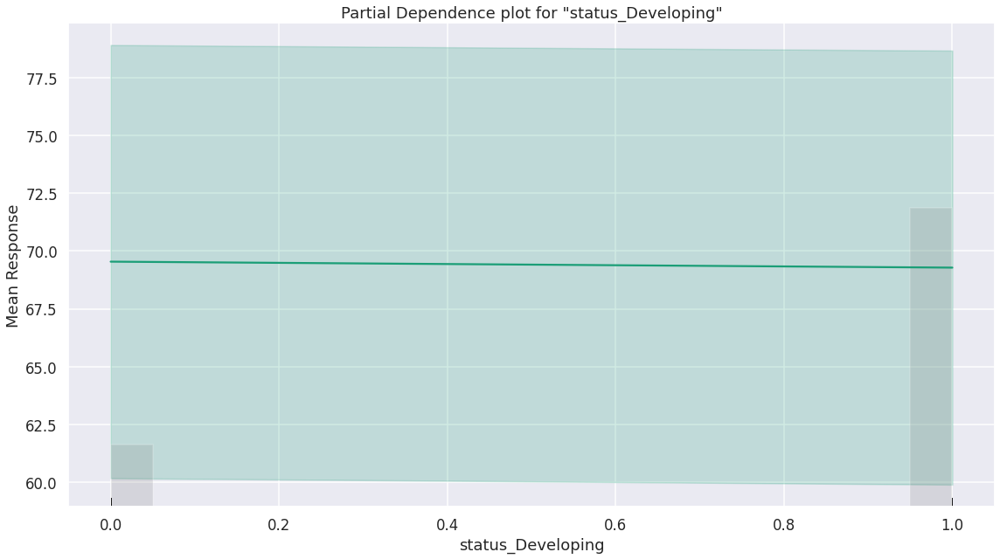

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

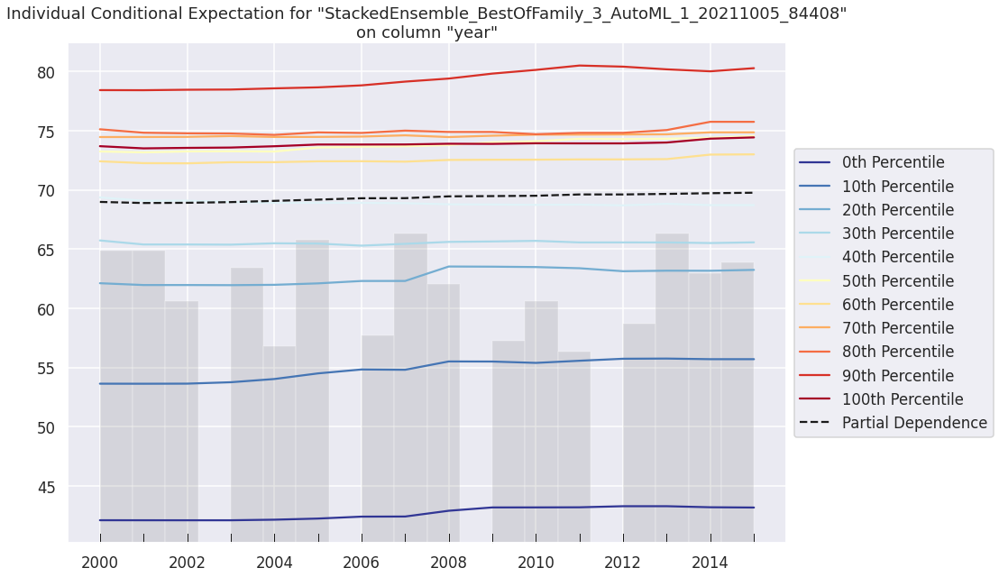

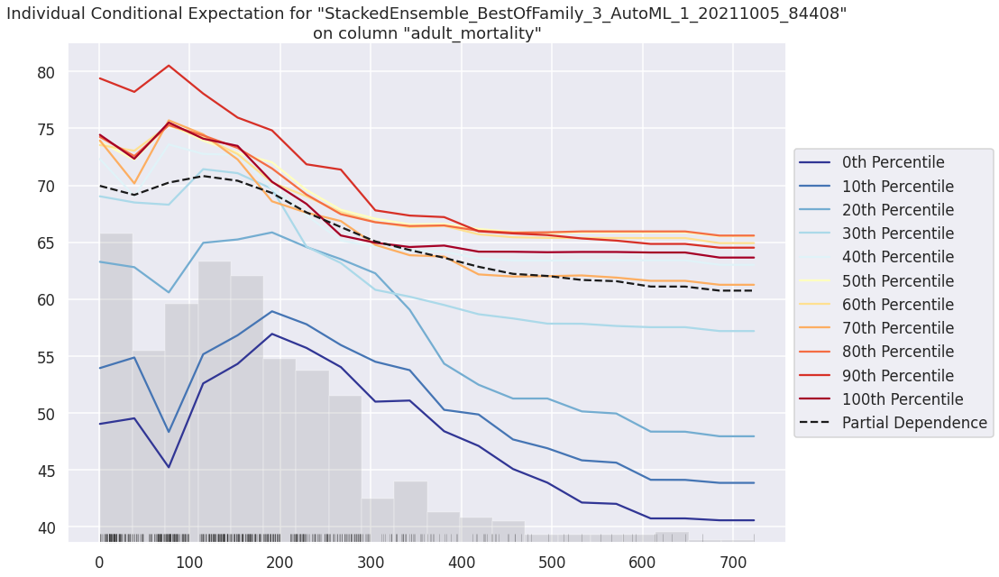

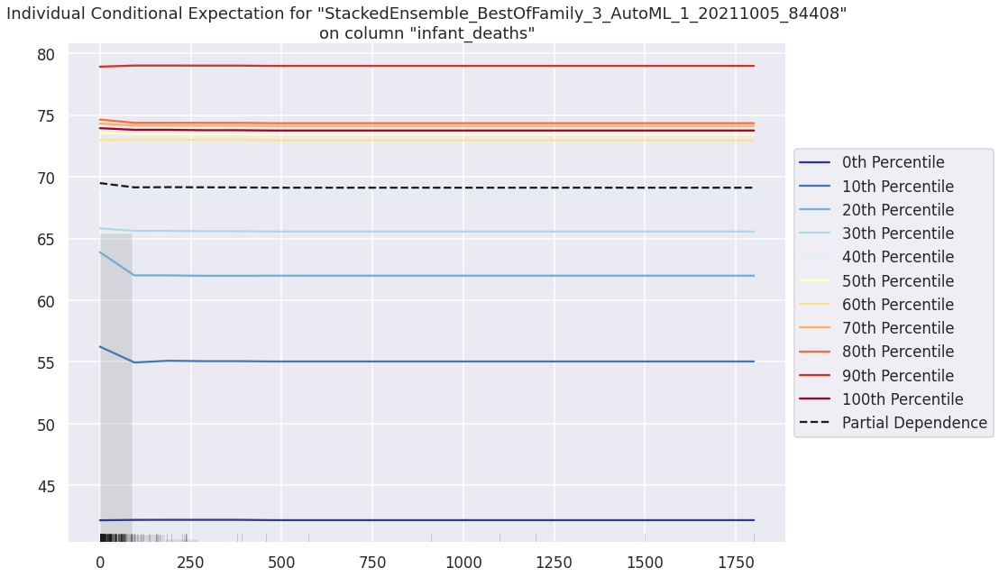

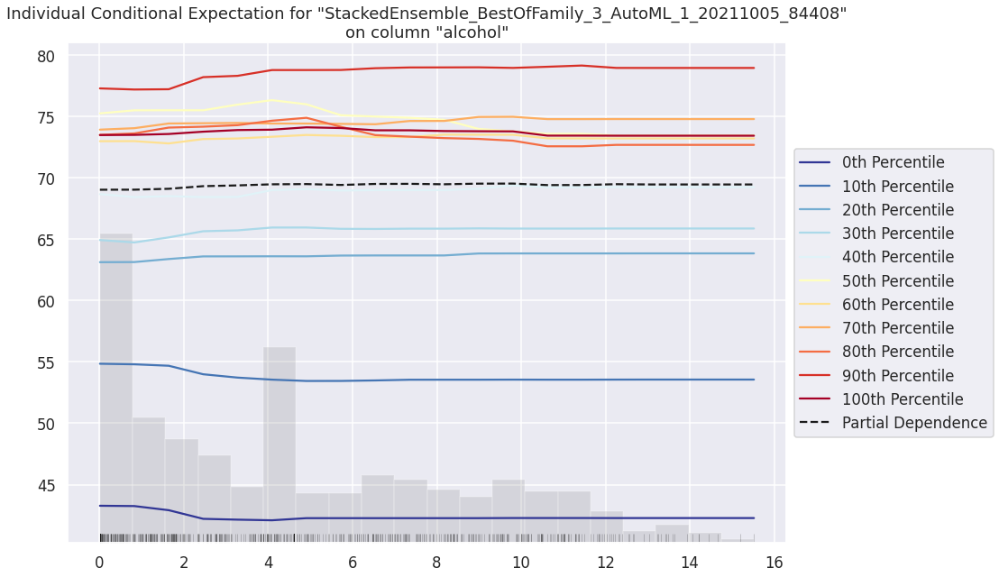

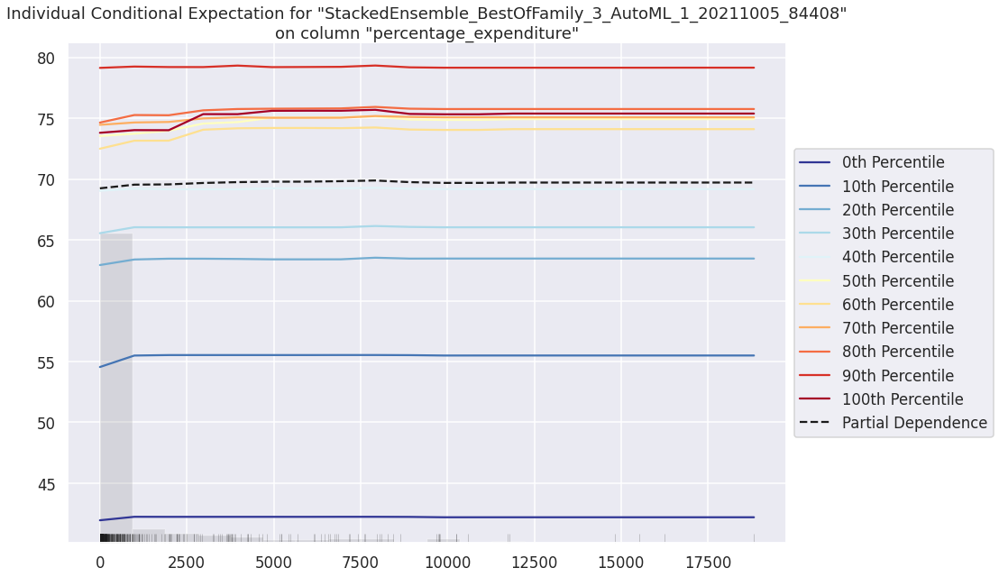

...

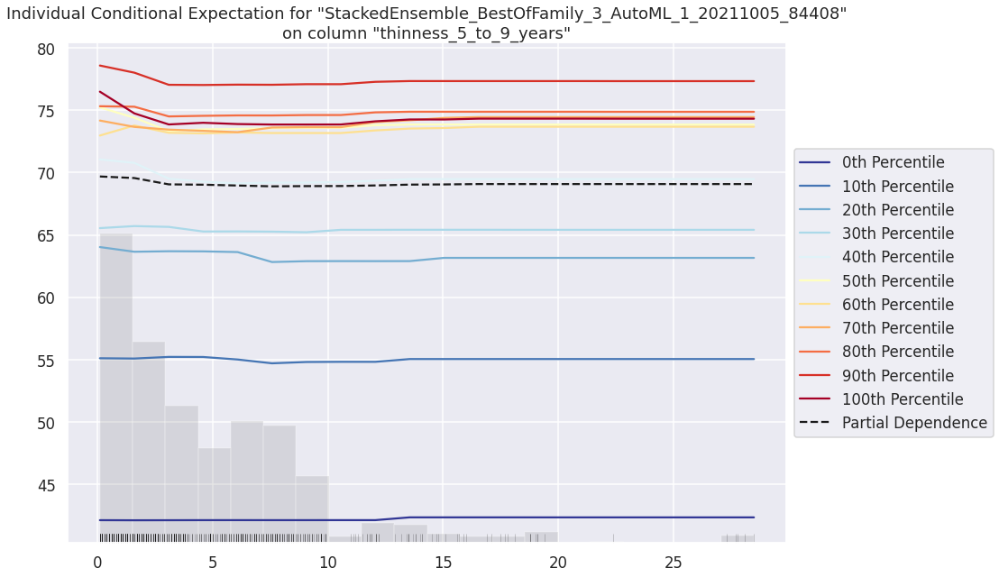

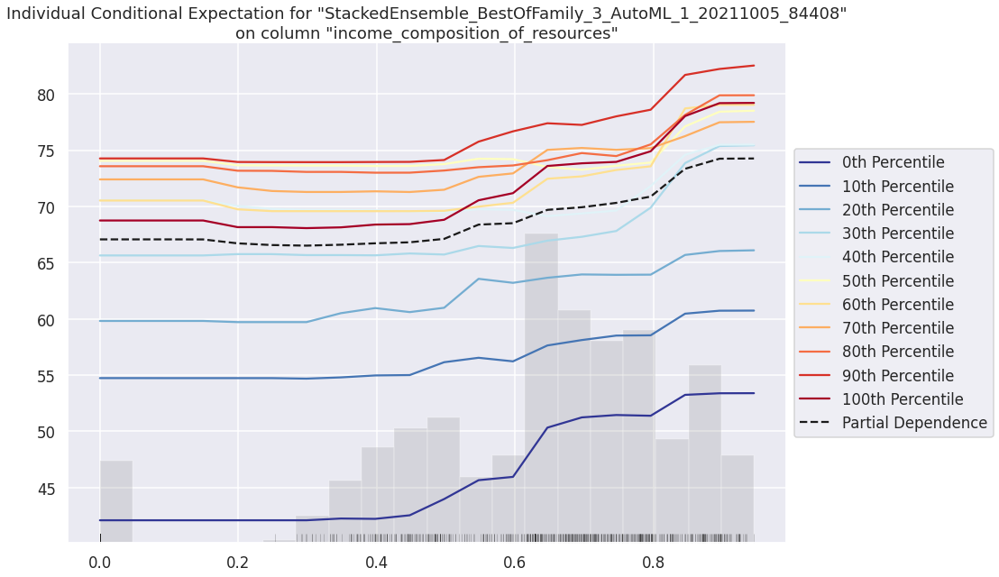

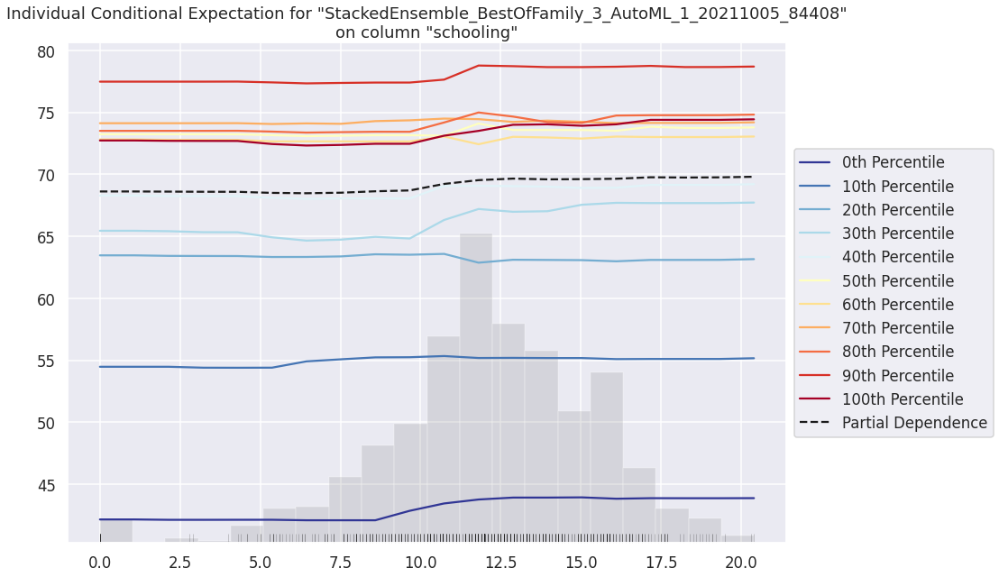

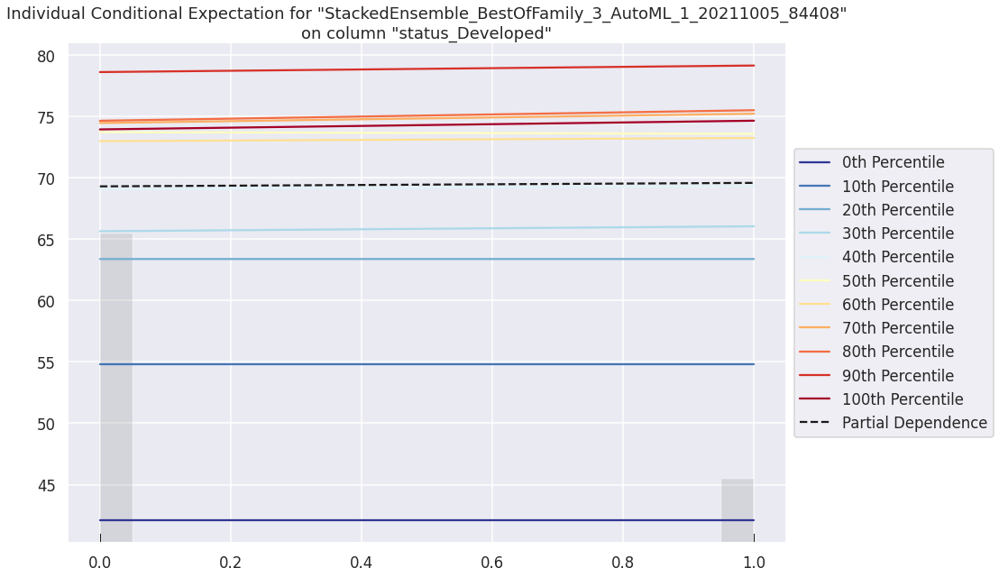

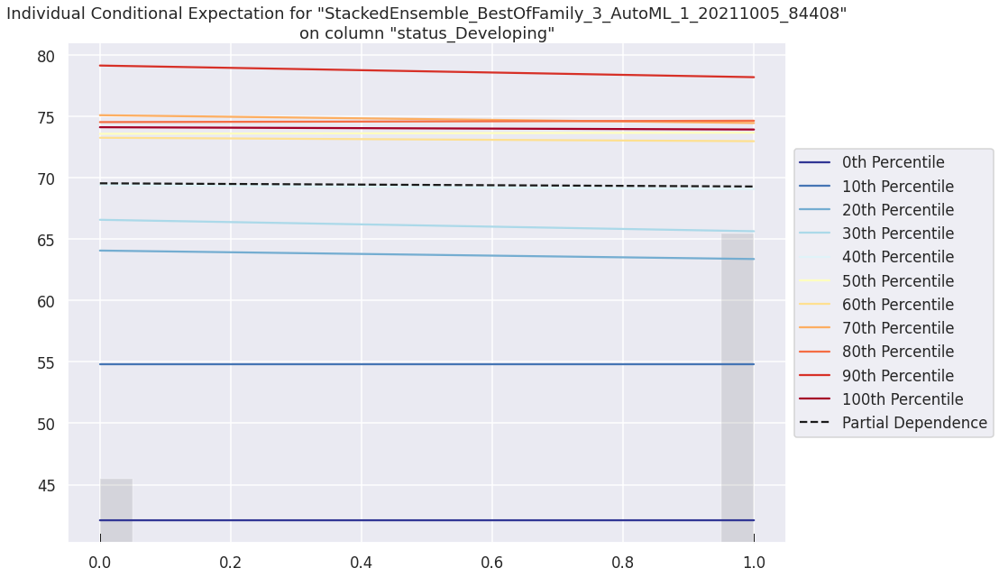

In [35]:
#explain a single H2O model (e.g. leader model from AutoML)
exm = aml.leader.explain(test)

## Make Prediction with Metalearner

In [36]:
#make prediction
preds = aml.leader.predict(test)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [37]:
#combine the prediction with the test dataset
df = test.cbind(preds)

#preview
df.head(10)

year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measle,bmi,under-five_deaths_,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_to_19_years,thinness_5_to_9_years,income_composition_of_resources,schooling,status_Developed,status_Developing,predict
2014,59.9,271,64,0.01,73.5236,62,492,18.6,86,58,8.18,62,0.1,612.697,327582,17.5,17.5,0.476,10,0,1,60.2981
2013,59.9,268,66,0.01,73.2192,64,430,18.1,89,62,8.13,64,0.1,631.745,3.17317e+07,17.7,17.7,0.47,9.9,0,1,60.5824
2007,57.5,295,82,0.02,10.9102,63,1141,15.2,113,63,6.73,63,0.1,369.836,2.66168e+07,19,19.1,0.415,8.4,0,1,58.1261
2000,54.8,321,88,0.01,10.425,62,6532,12.2,122,24,8.2,24,0.1,114.56,293756,2.3,2.5,0.338,5.5,0,1,55.3136
2015,77.8,74,0,4.6,364.975,99,0,58,0,99,6,99,0.1,3954.23,28873,1.2,1.3,0.762,14.2,0,1,78.393
2003,72.8,18,1,4.29,14.7193,97,8,47.9,1,97,6.27,97,0.1,189.682,339616,1.9,2,0.674,10.7,0,1,73.0857
2000,72.6,11,1,3.66,91.7115,96,662,45,1,97,6.26,97,0.1,1175.79,38927,2.1,2.2,0.656,10.7,0,1,73.6514
2014,75.4,11,21,0.01,54.2373,95,0,58.4,24,95,7.21,95,0.1,547.852,3.91133e+07,6,5.8,0.741,14.4,0,1,74.4121
2012,75.1,113,21,0.66,555.926,95,18,56.1,24,95,6.14,95,0.1,5564.83,3.75658e+07,5.9,5.8,0.732,14.4,0,1,74.8618
2011,74.9,116,21,0.56,509.002,95,112,55,24,95,5.29,95,0.1,5432.25,3.68196e+07,5.9,5.8,0.724,14,0,1,74.822


In [68]:
h2o_as_pd = h2o.as_list(df)

In [69]:
h2o_as_pd.to_csv('prediction.csv')

In [73]:
prediction = pd.read_csv('prediction.csv', index_col=0)
prediction.head(10)

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measle,bmi,under-five_deaths_,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_to_19_years,thinness_5_to_9_years,income_composition_of_resources,schooling,status_Developed,status_Developing,predict
0,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,0,1,60.298067
1,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,0,1,60.582404
2,2007,57.5,295.0,82,0.02,10.910156,63.0,1141,15.2,113,63.0,6.73,63.0,0.1,369.835796,26616792.0,19.0,19.1,0.415,8.4,0,1,58.126082
3,2000,54.8,321.0,88,0.01,10.424960,62.0,6532,12.2,122,24.0,8.20,24.0,0.1,114.560000,293756.0,2.3,2.5,0.338,5.5,0,1,55.313644
4,2015,77.8,74.0,0,4.60,364.975229,99.0,0,58.0,0,99.0,6.00,99.0,0.1,3954.227830,28873.0,1.2,1.3,0.762,14.2,0,1,78.393005
5,2003,72.8,18.0,1,4.29,14.719289,97.0,8,47.9,1,97.0,6.27,97.0,0.1,189.681557,339616.0,1.9,2.0,0.674,10.7,0,1,73.085695
6,2000,72.6,11.0,1,3.66,91.711541,96.0,662,45.0,1,97.0,6.26,97.0,0.1,1175.788981,38927.0,2.1,2.2,0.656,10.7,0,1,73.651363
7,2014,75.4,11.0,21,0.01,54.237318,95.0,0,58.4,24,95.0,7.21,95.0,0.1,547.851700,39113313.0,6.0,5.8,0.741,14.4,0,1,74.412060
8,2012,75.1,113.0,21,0.66,555.926083,95.0,18,56.1,24,95.0,6.14,95.0,0.1,5564.825660,37565847.0,5.9,5.8,0.732,14.4,0,1,74.861760
9,2011,74.9,116.0,21,0.56,509.002041,95.0,112,55.0,24,95.0,5.29,95.0,0.1,5432.252300,36819558.0,5.9,5.8,0.724,14.0,0,1,74.822038


In [77]:
preds = prediction[['life_expectancy', 'predict']].head(20)
preds

,life_expectancy,predict
0,59.9,60.298067
1,59.9,60.582404
2,57.5,58.126082
3,54.8,55.313644
4,77.8,78.393005
5,72.8,73.085695
6,72.6,73.651363
7,75.4,74.412060
8,75.1,74.861760
9,74.9,74.822038


In [78]:
preds.to_csv('preds.csv')

# Base Learner Exploration

## GBM

In [39]:
#import top performing base learner
base_model = h2o.get_model('GBM_4_AutoML_1_20211005_84408')

In [40]:
#evaluate the base learner on the test set
base_model.model_performance(test)


ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 3.1773579289747538
RMSE: 1.7825144961471573
MAE: 1.1371052826789811
RMSLE: 0.026807112315908065
Mean Residual Deviance: 3.1773579289747538


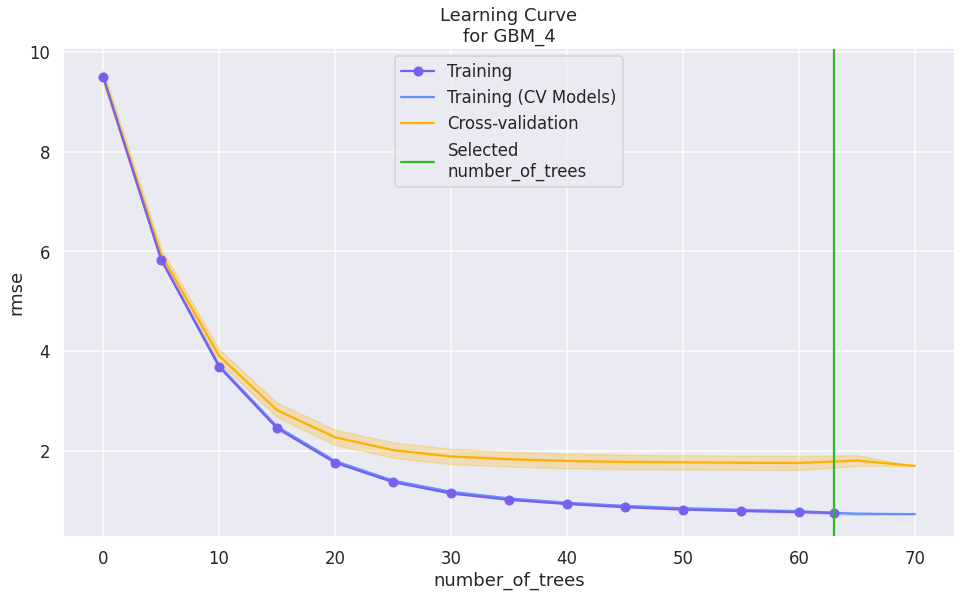

In [41]:
learning_curve_plot = base_model.learning_curve_plot()

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

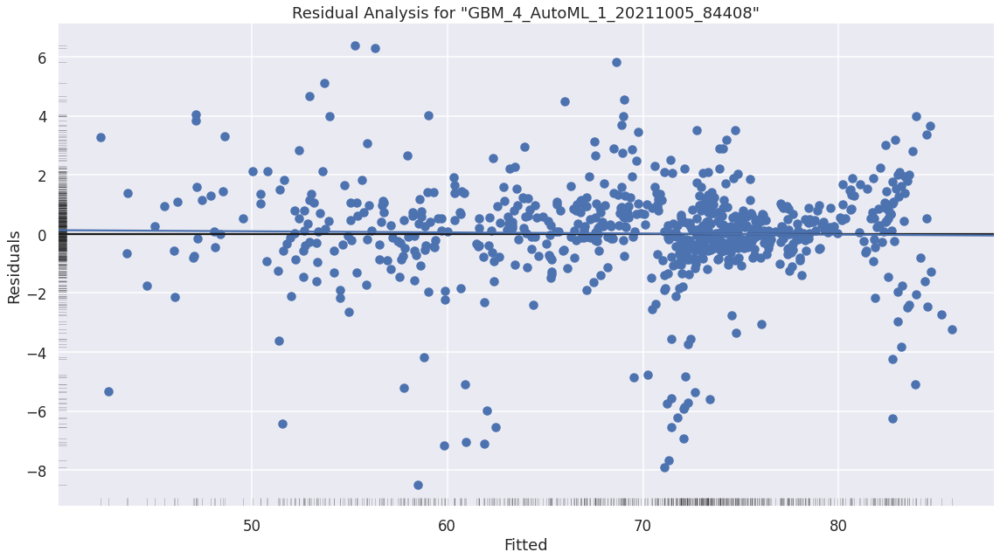

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

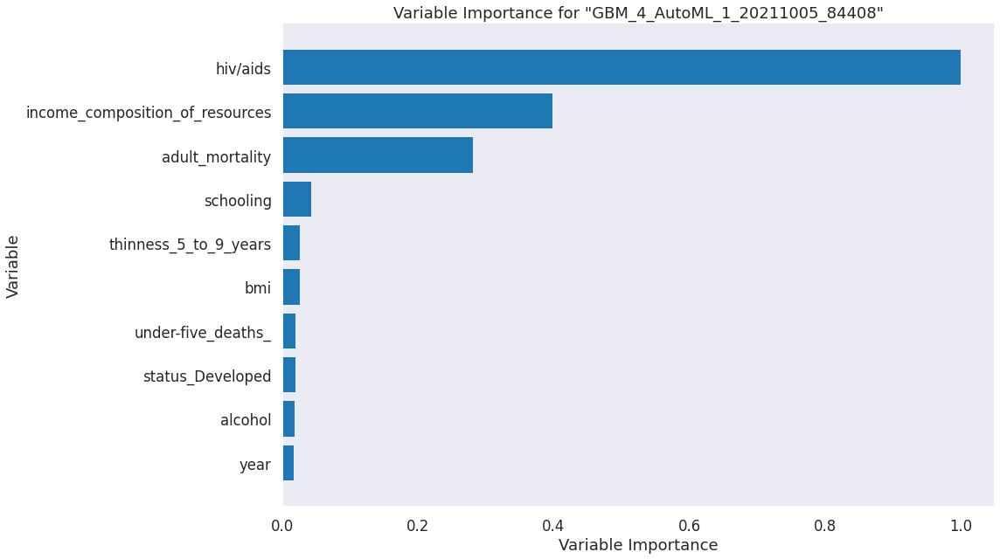

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

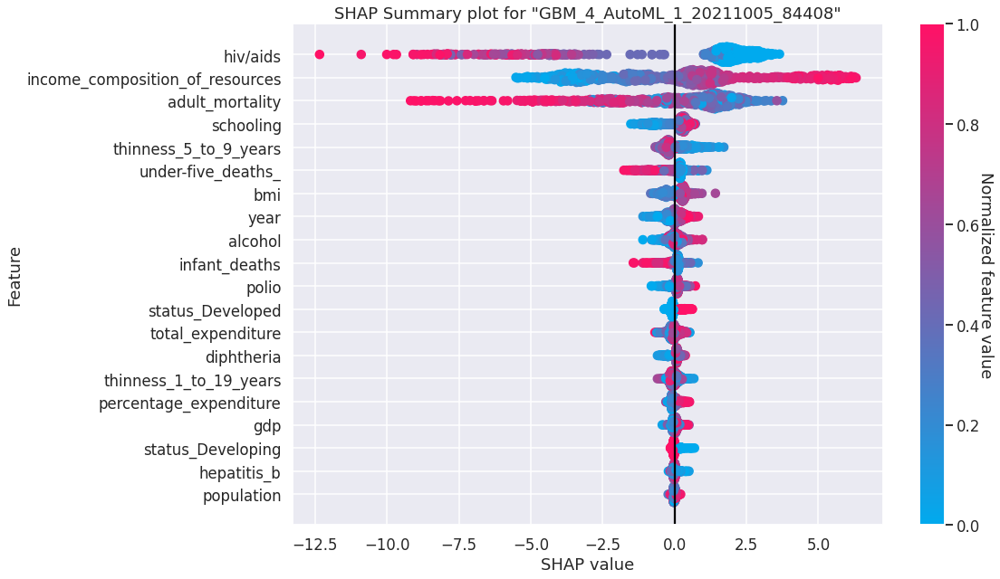

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

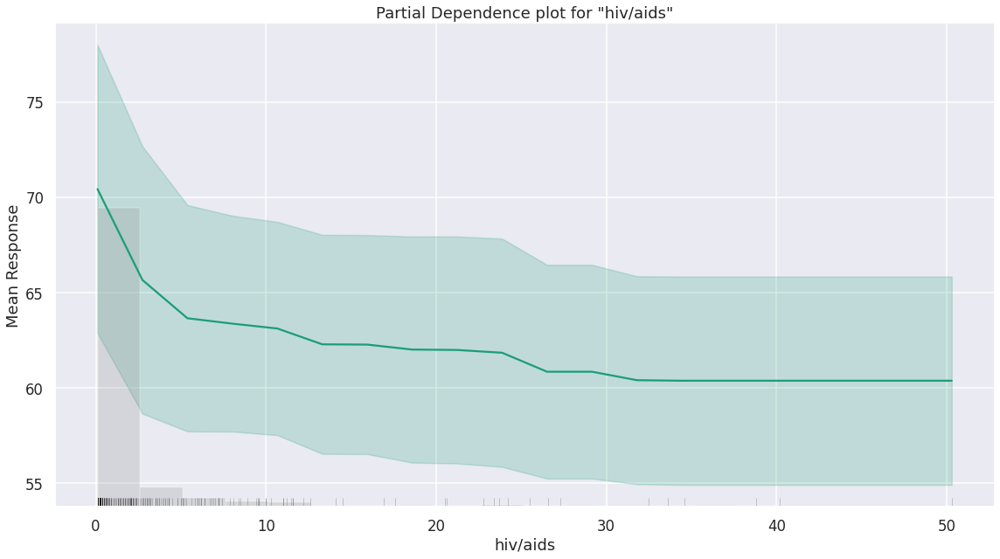

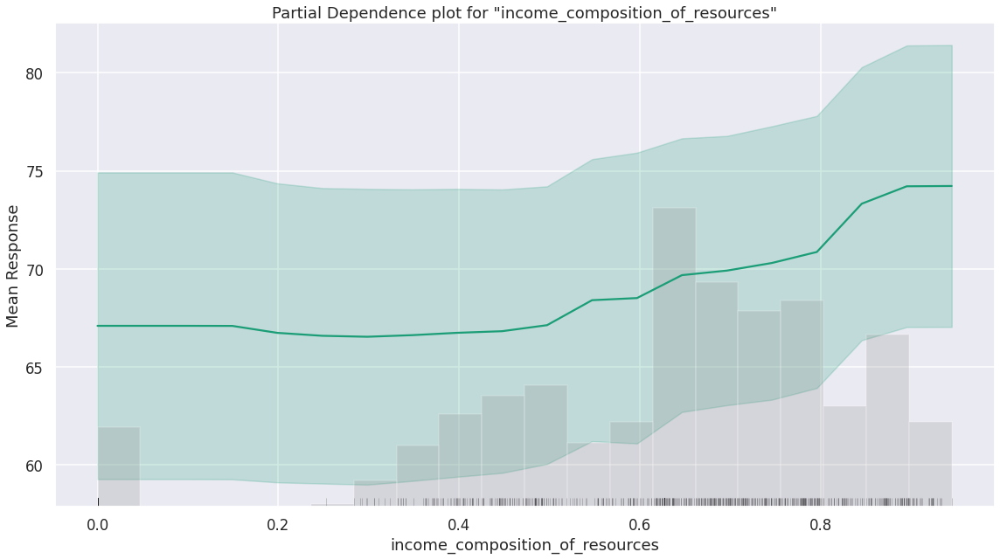

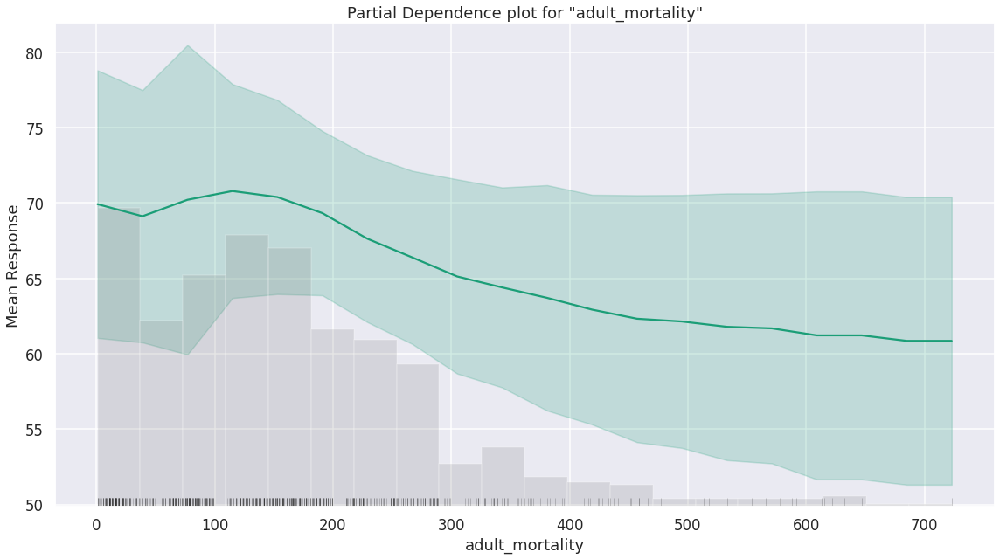

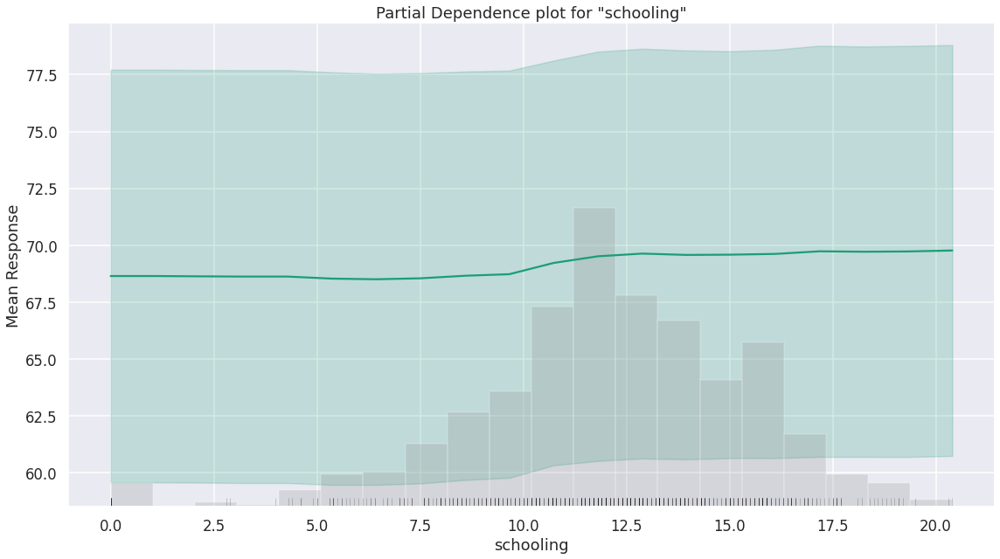

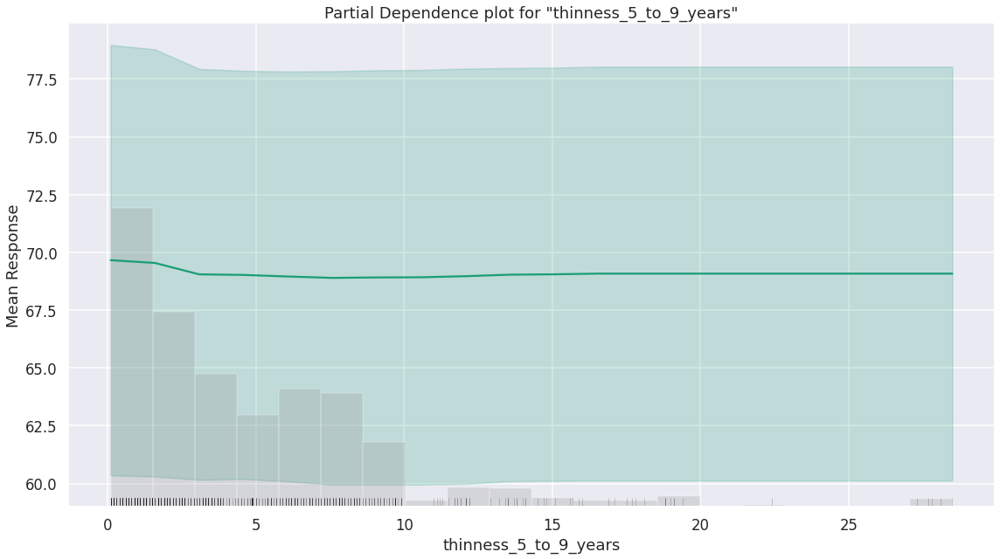

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

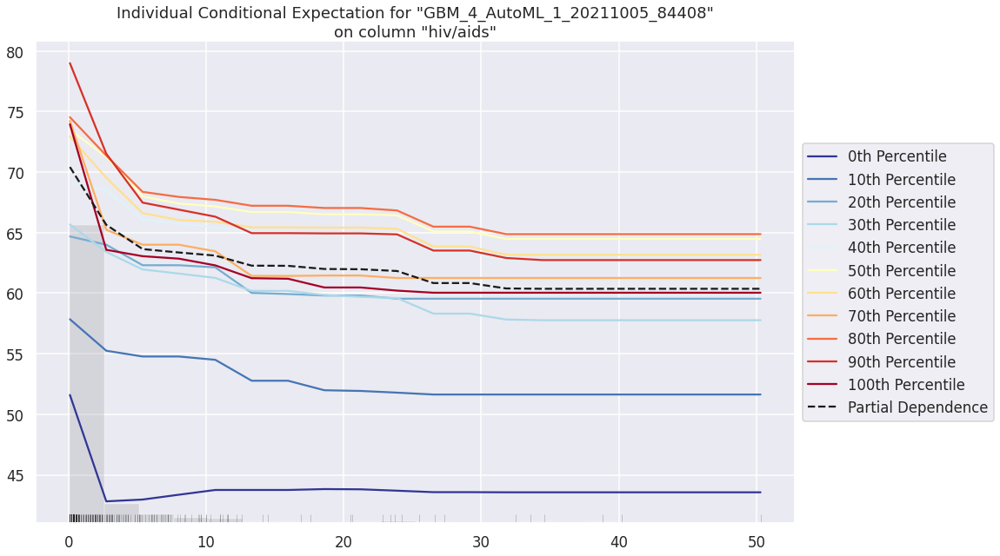

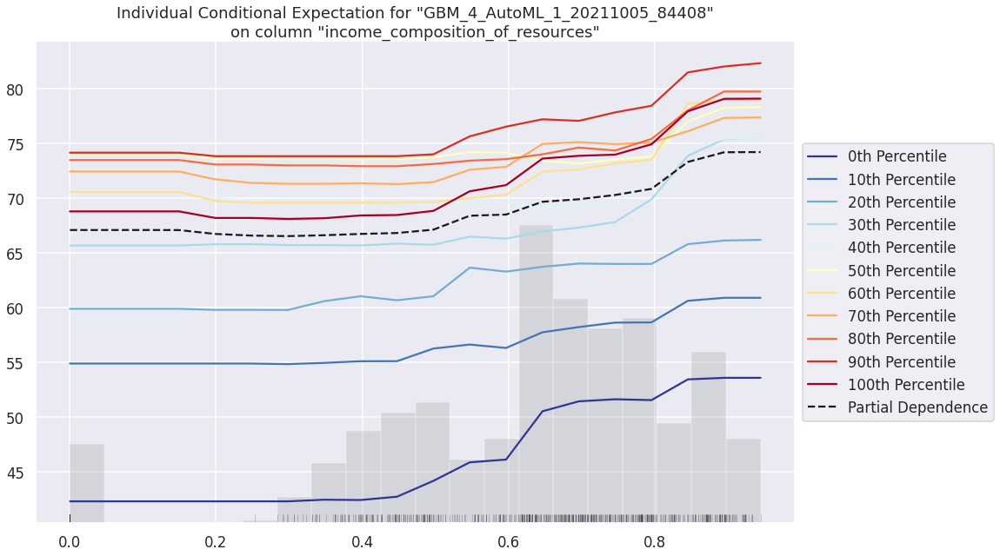

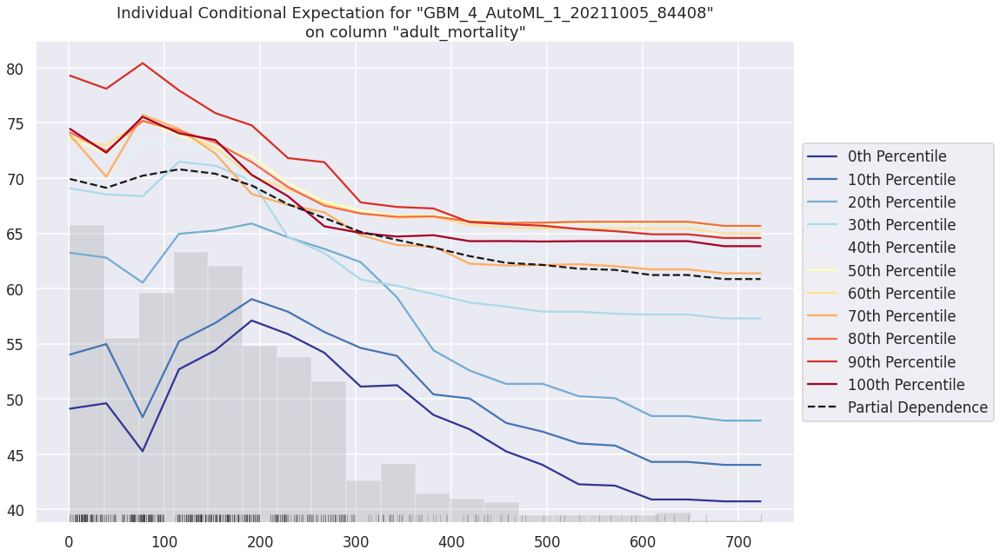

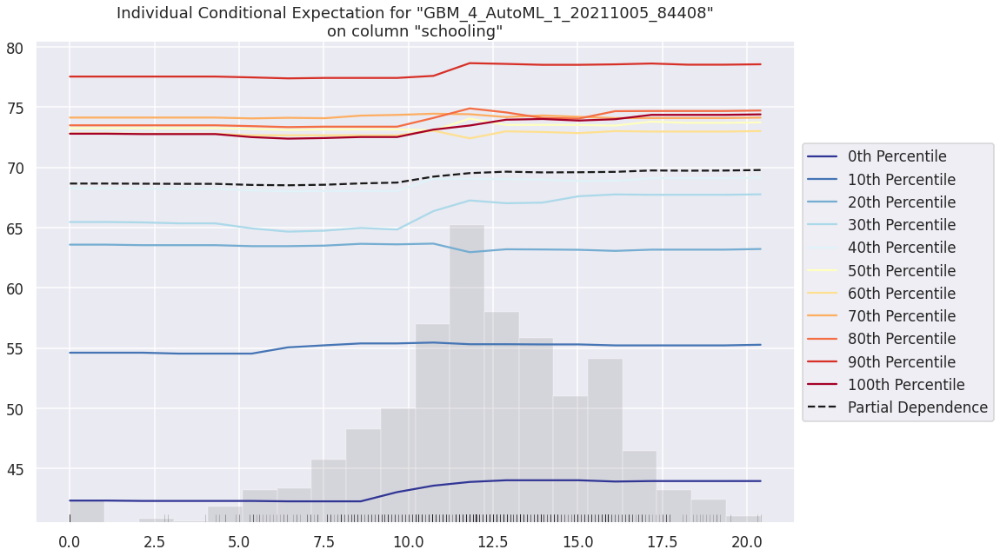

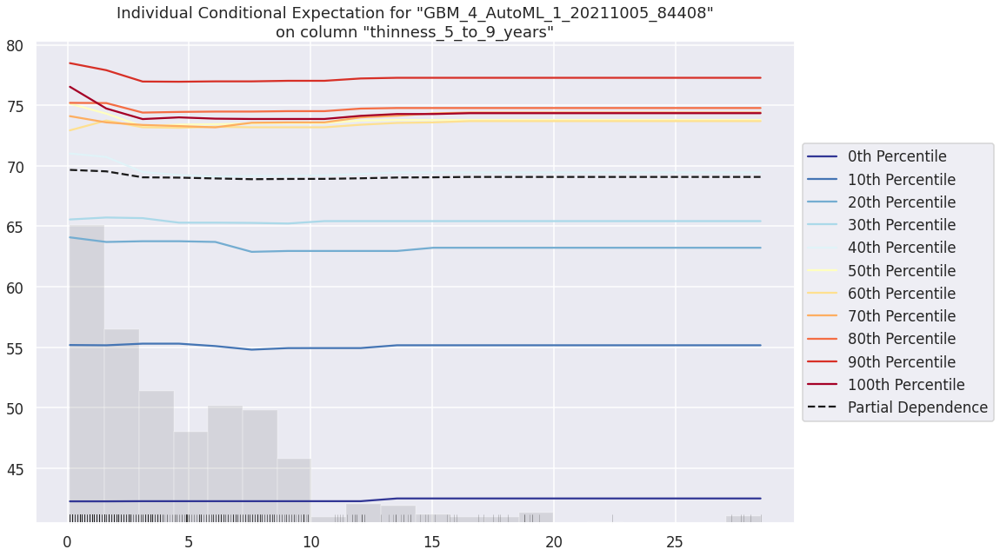

In [42]:
#explain a model
base_exm = base_model.explain(test)

## XRT

In [43]:
#import base learner
base_model = h2o.get_model('XRT_1_AutoML_1_20211005_84408')

#evaluate the base learner on the test set
base_model.model_performance(test)


ModelMetricsRegression: drf
** Reported on test data. **

MSE: 3.501642297454855
RMSE: 1.8712675643677616
MAE: 1.1820471748785562
RMSLE: 0.028424414614451127
Mean Residual Deviance: 3.501642297454855


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

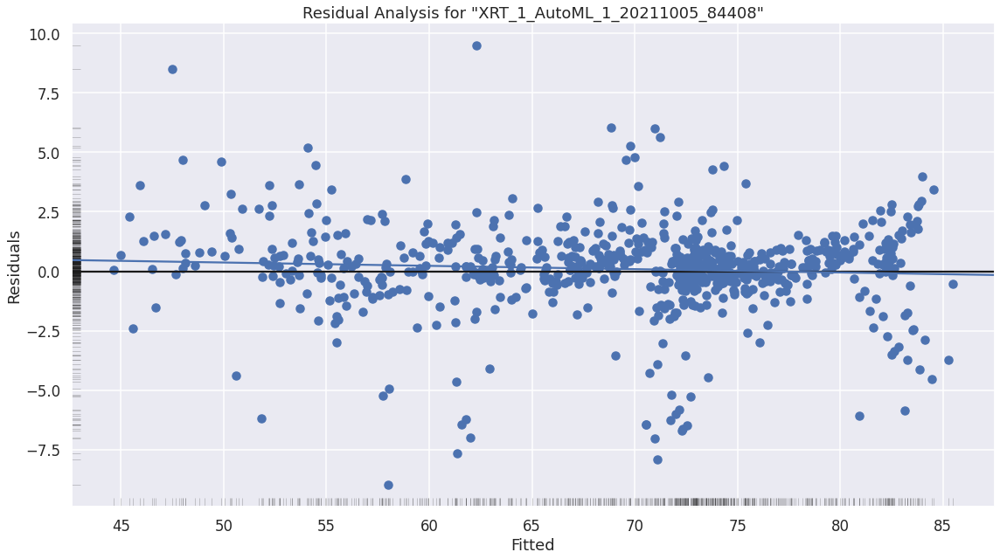

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

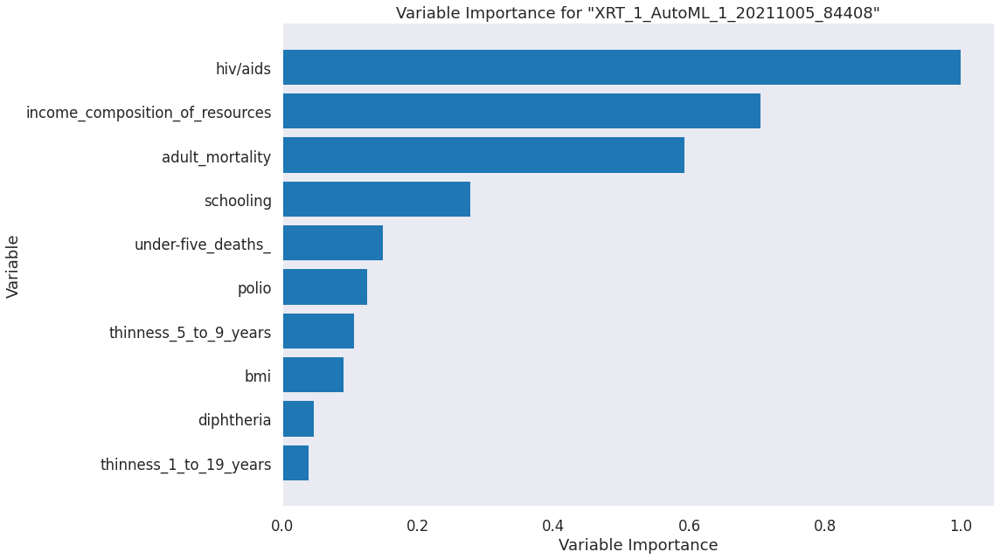

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

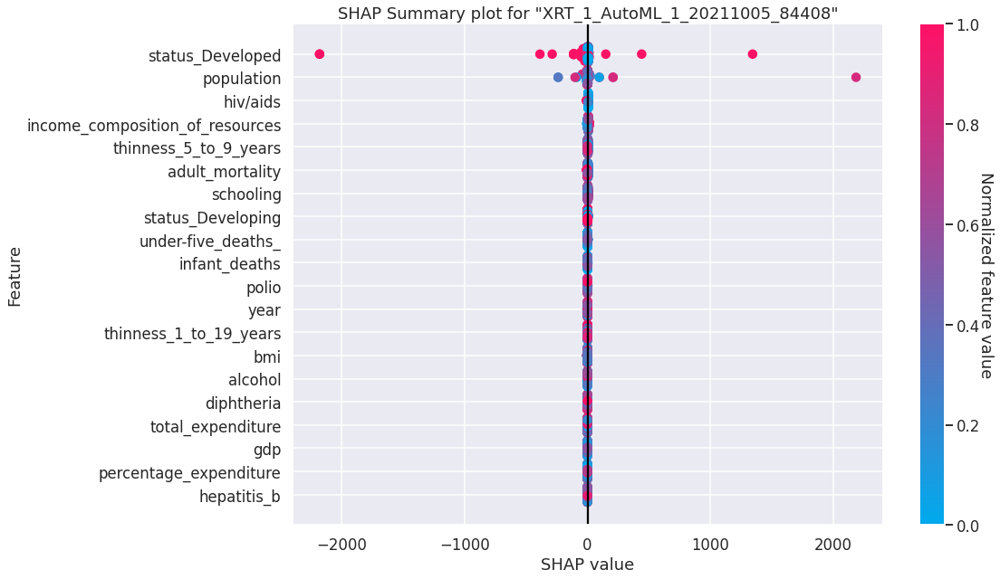

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

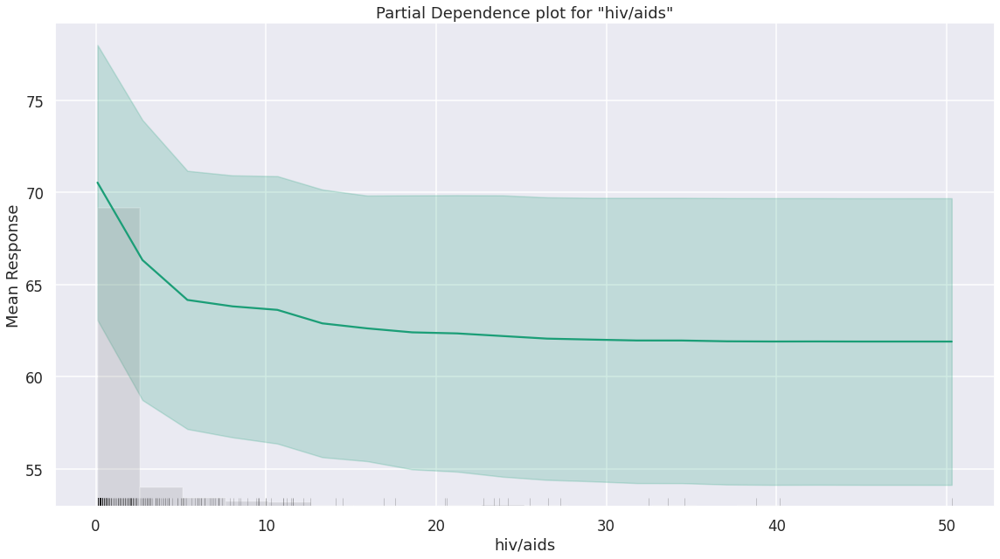

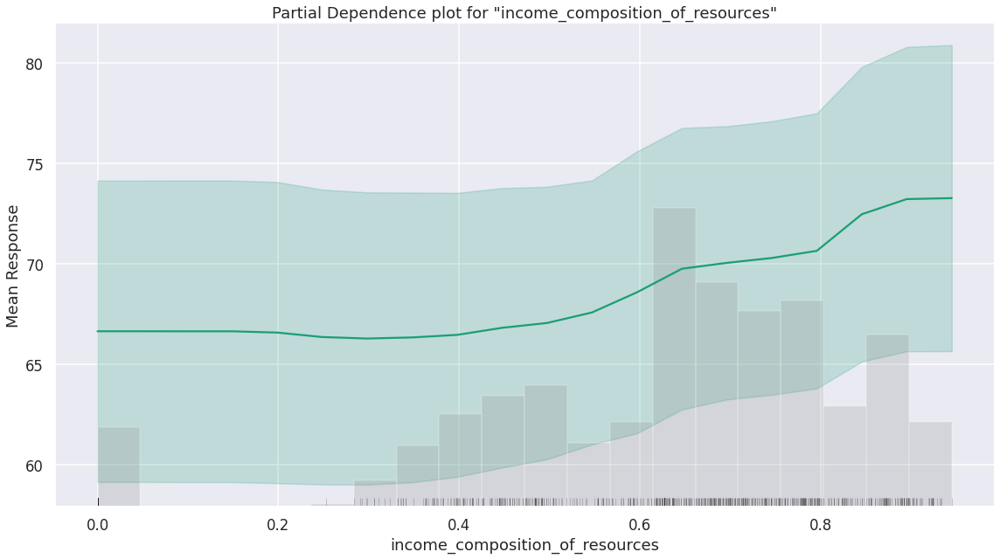

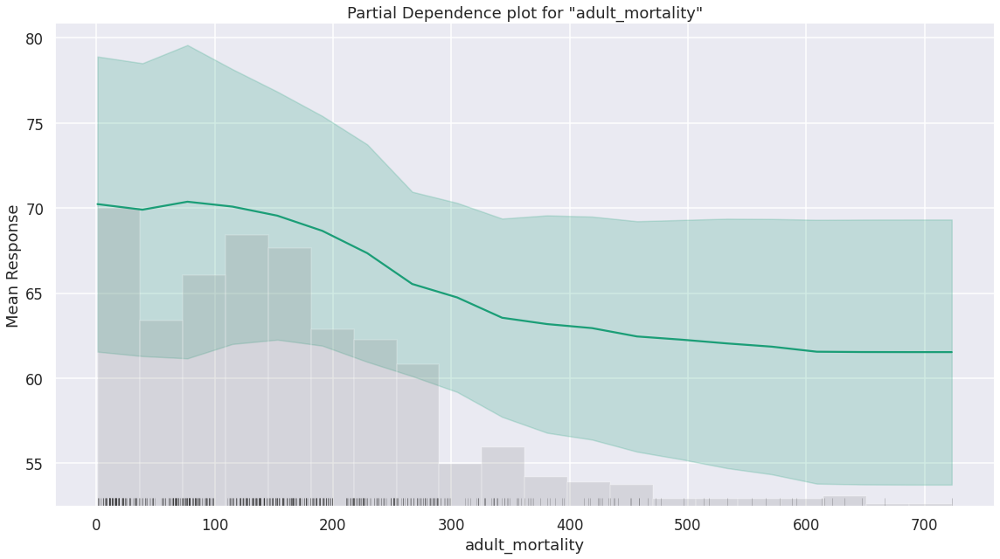

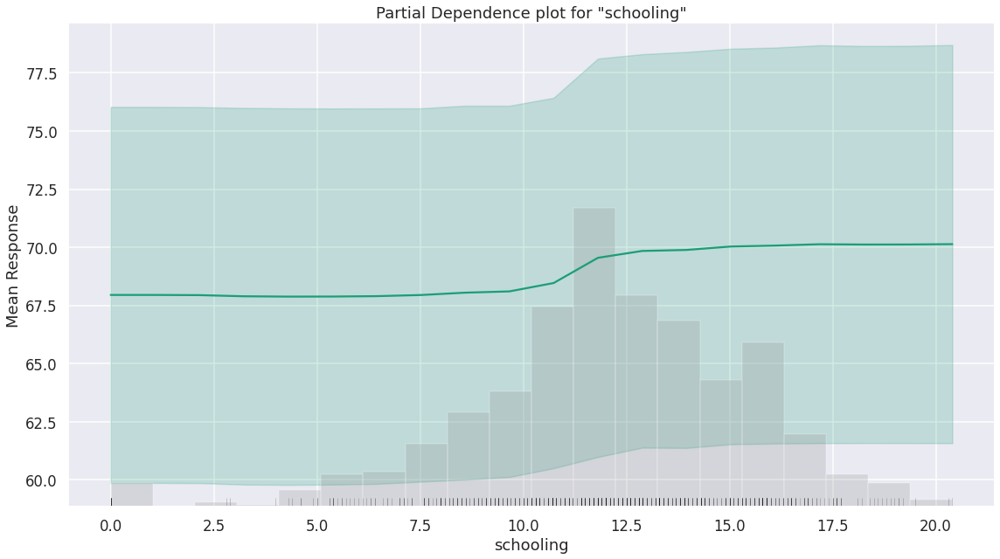

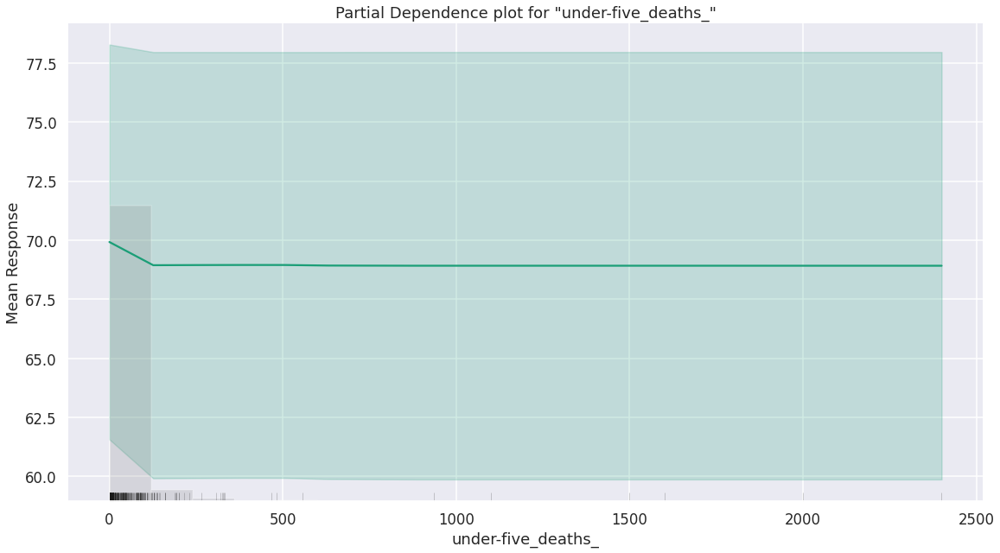

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

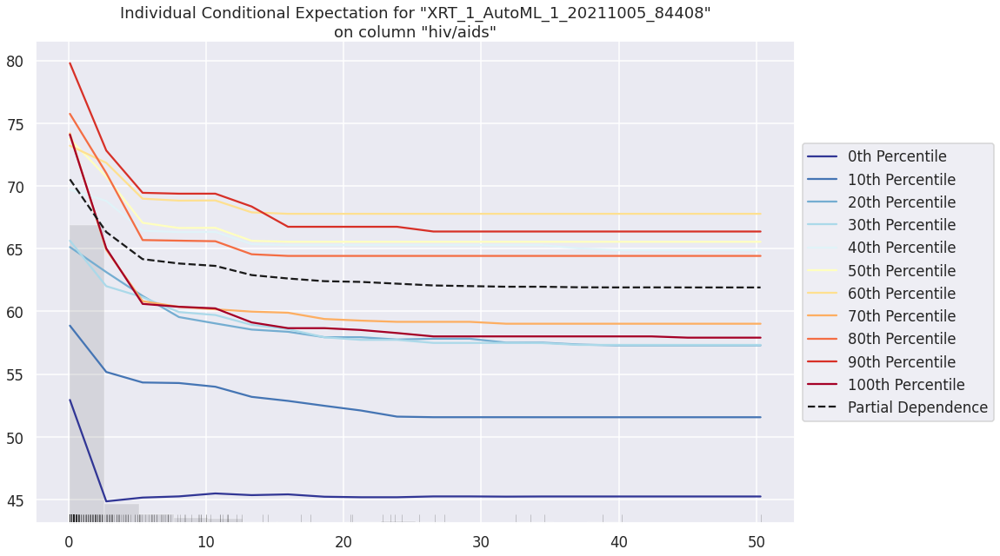

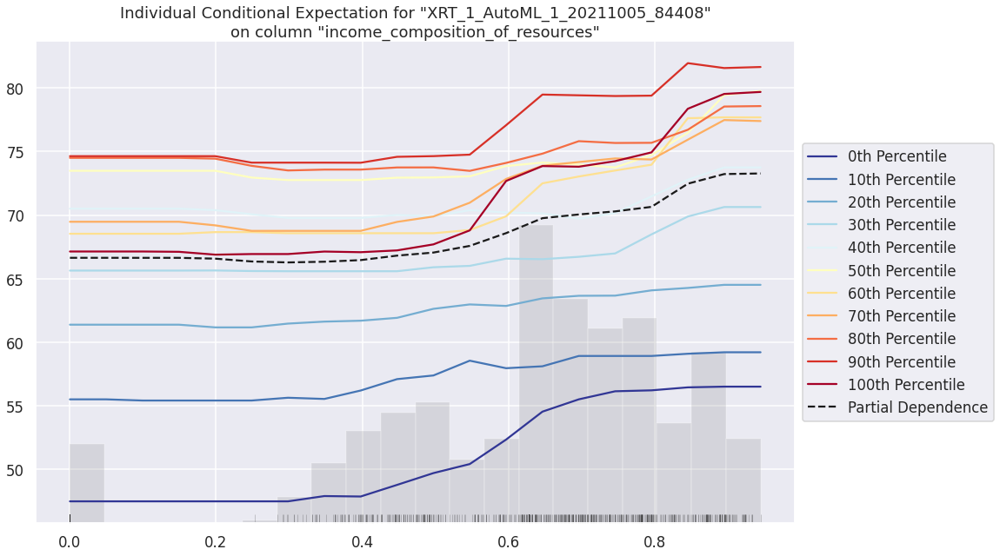

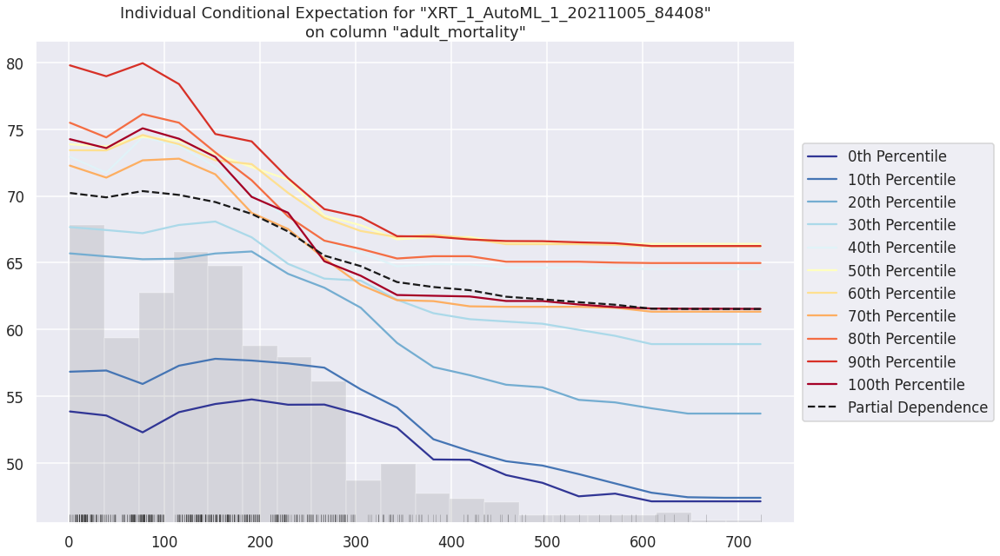

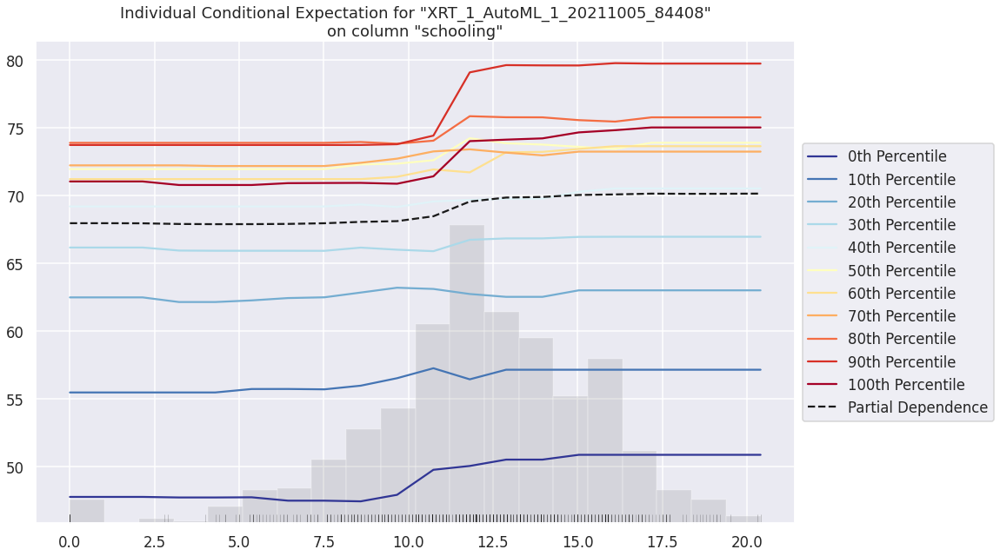

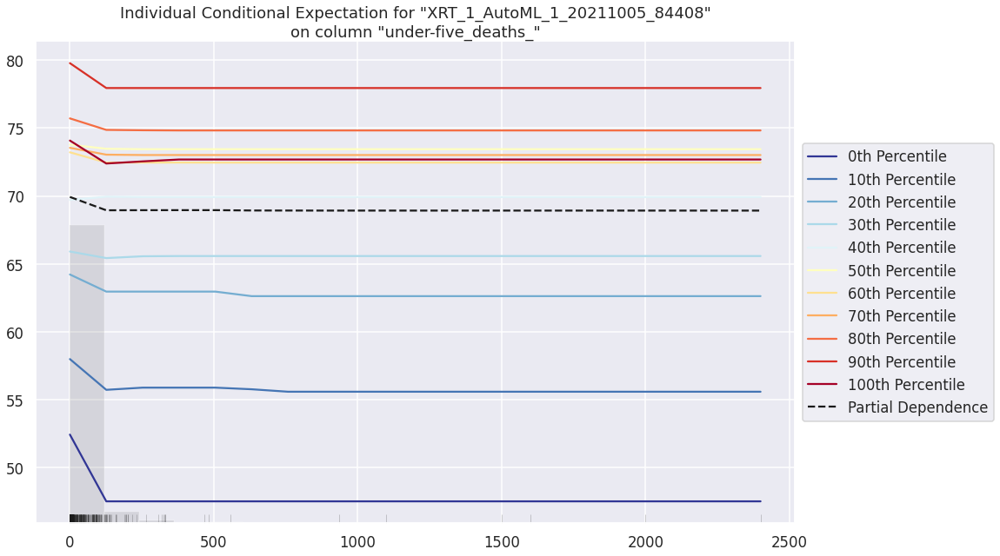

In [44]:
#explain a model
base_exm = base_model.explain(test)

## XGBoost

In [46]:
#import base learner
base_model = h2o.get_model('XGBoost_3_AutoML_1_20211005_84408')

#evaluate the base learner on the test set
base_model.model_performance(test)


ModelMetricsRegression: xgboost
** Reported on test data. **

MSE: 4.0340546393198675
RMSE: 2.0084956159573433
MAE: 1.3852163356739087
RMSLE: 0.030024892794333465
Mean Residual Deviance: 4.0340546393198675


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

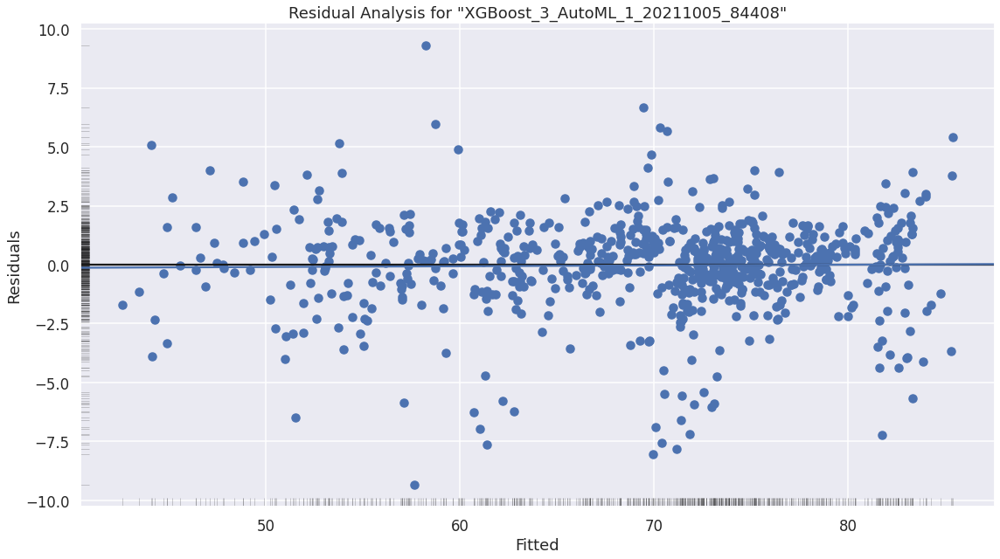

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

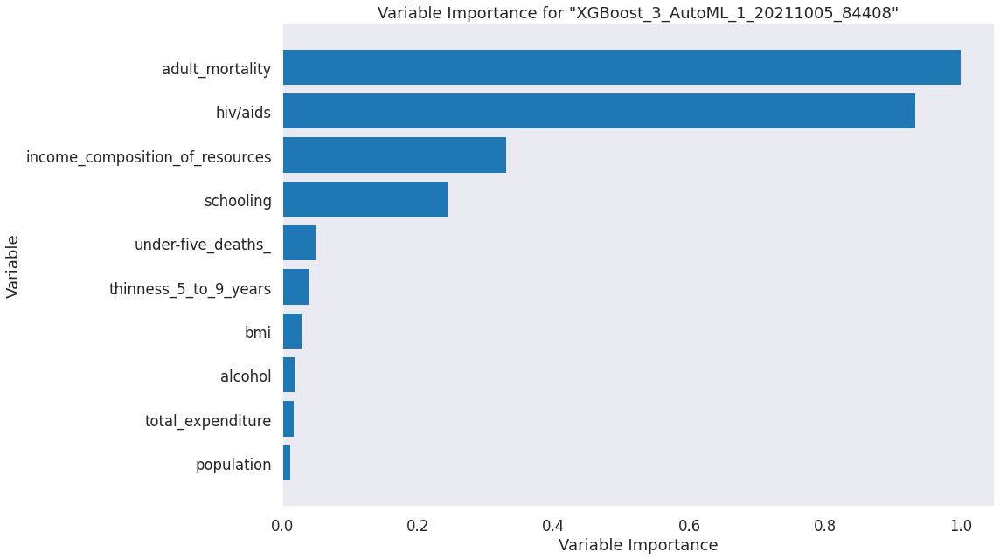

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

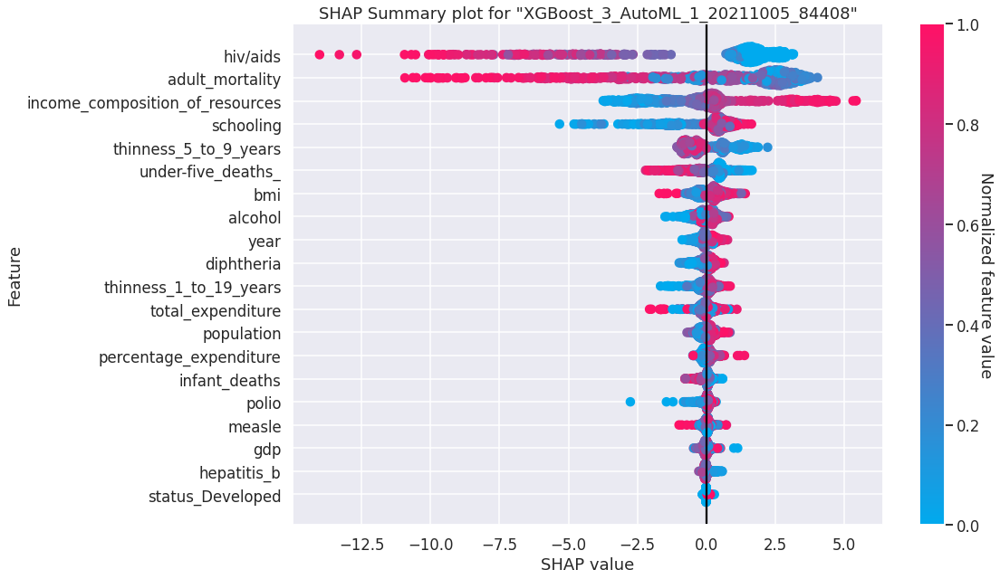

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

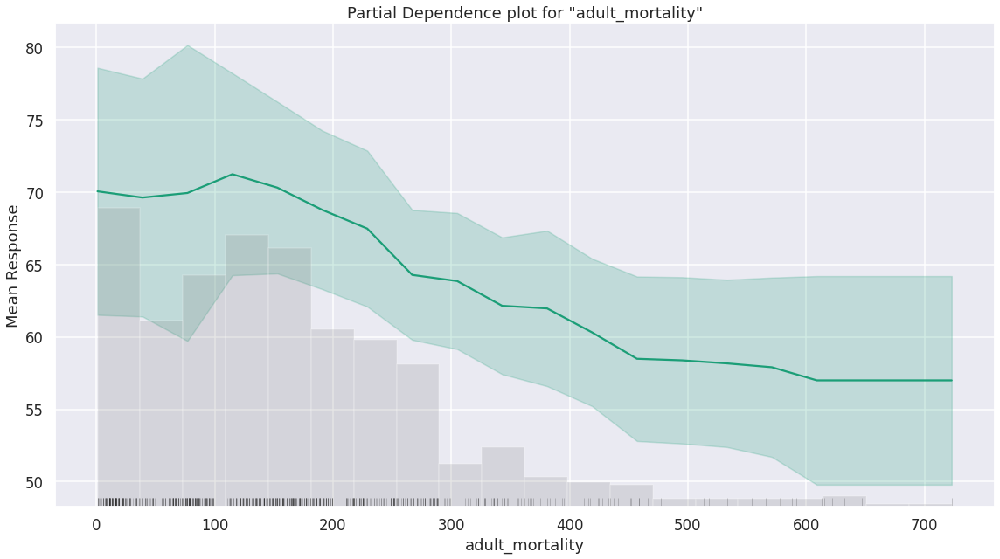

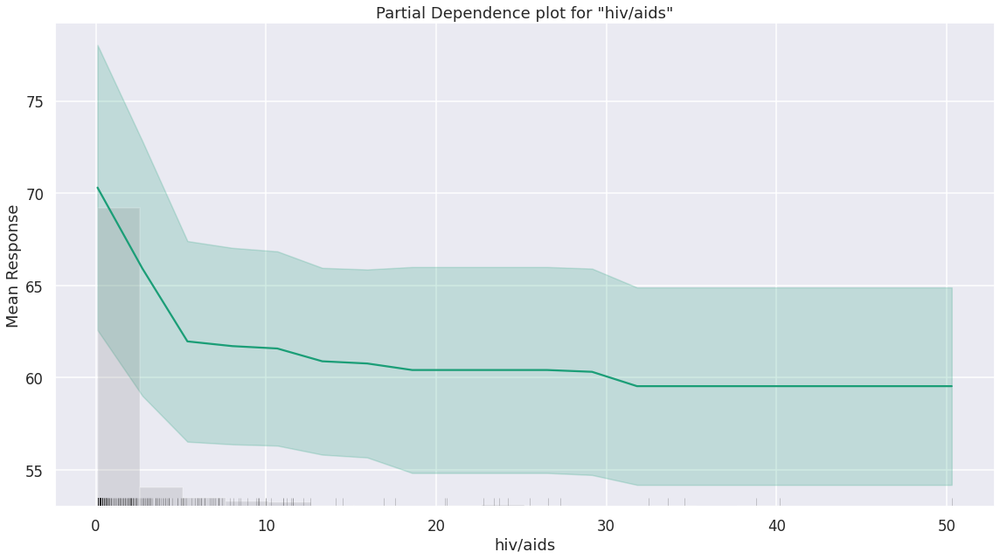

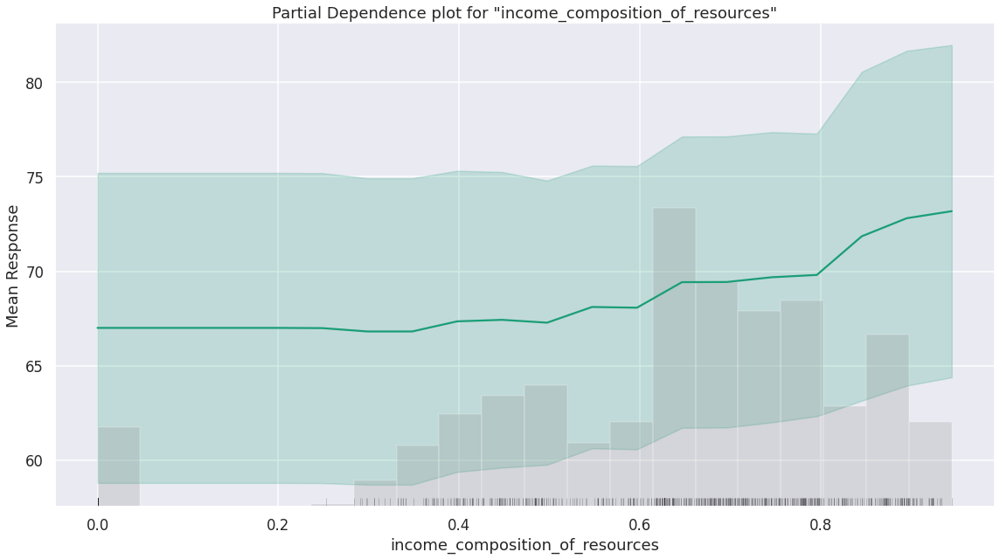

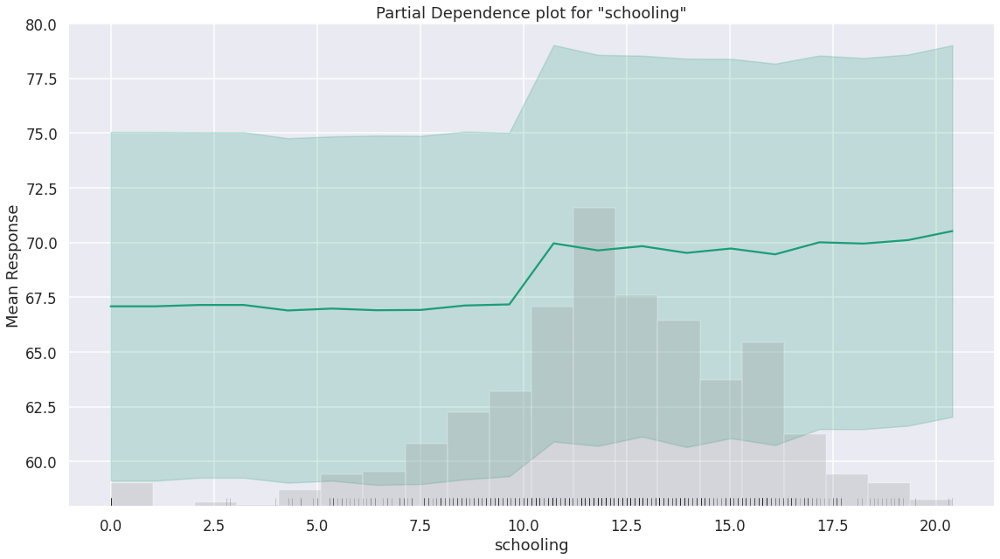

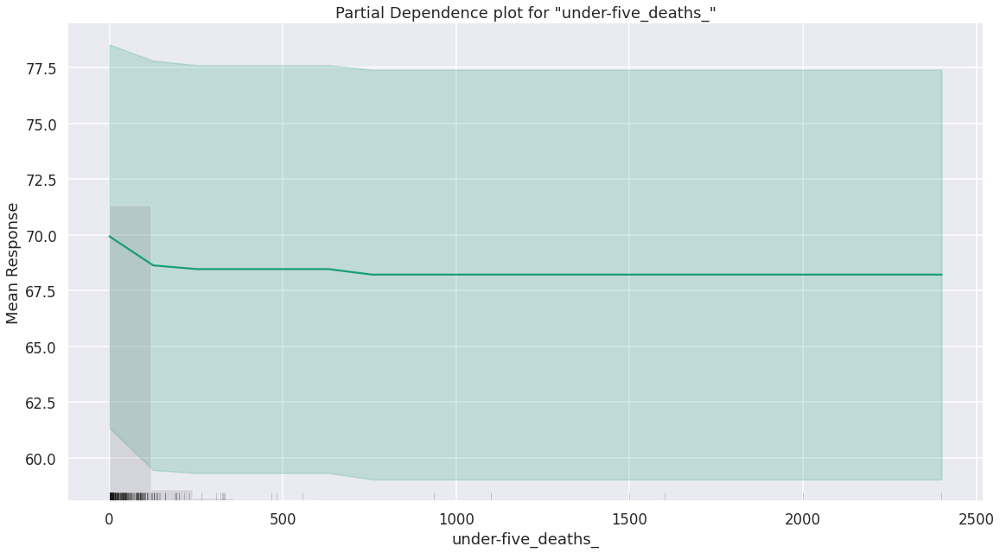

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

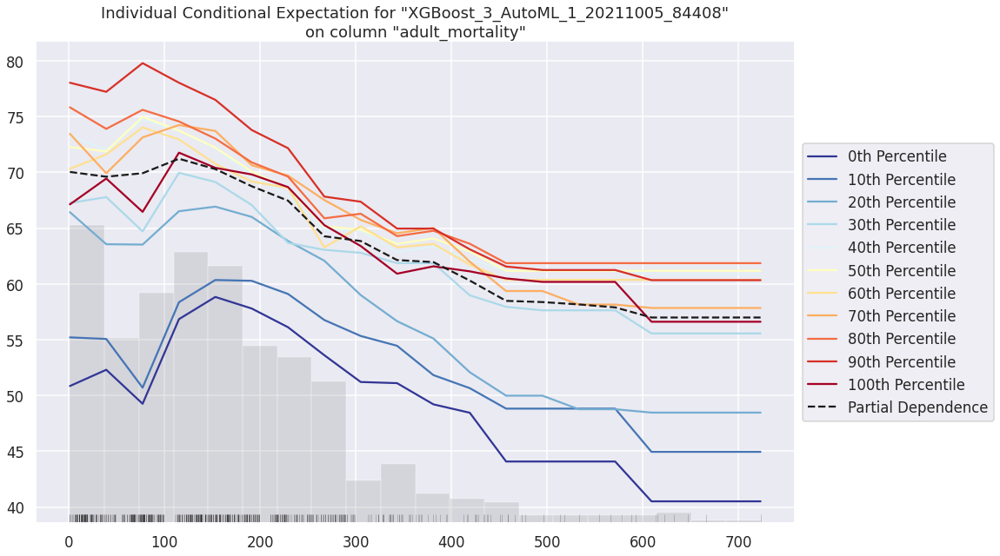

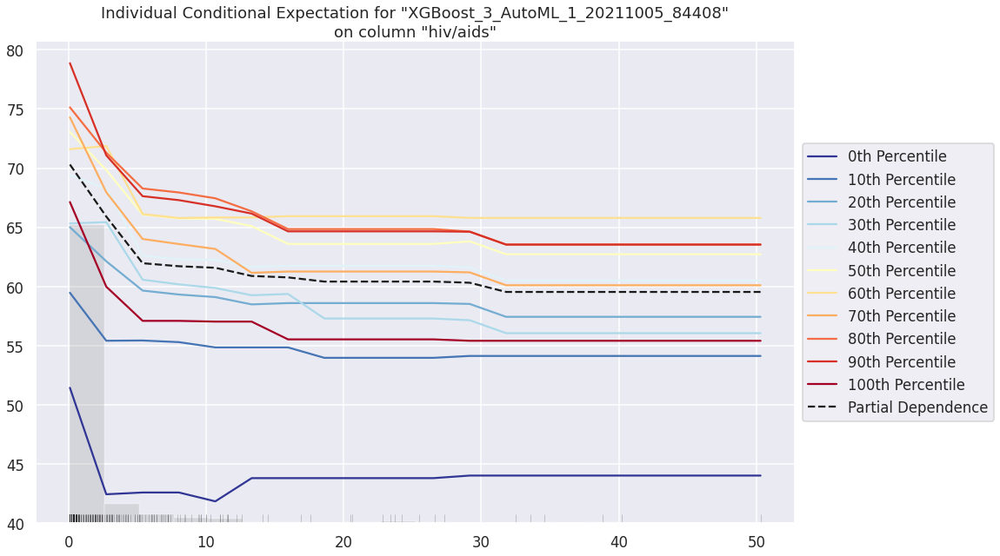

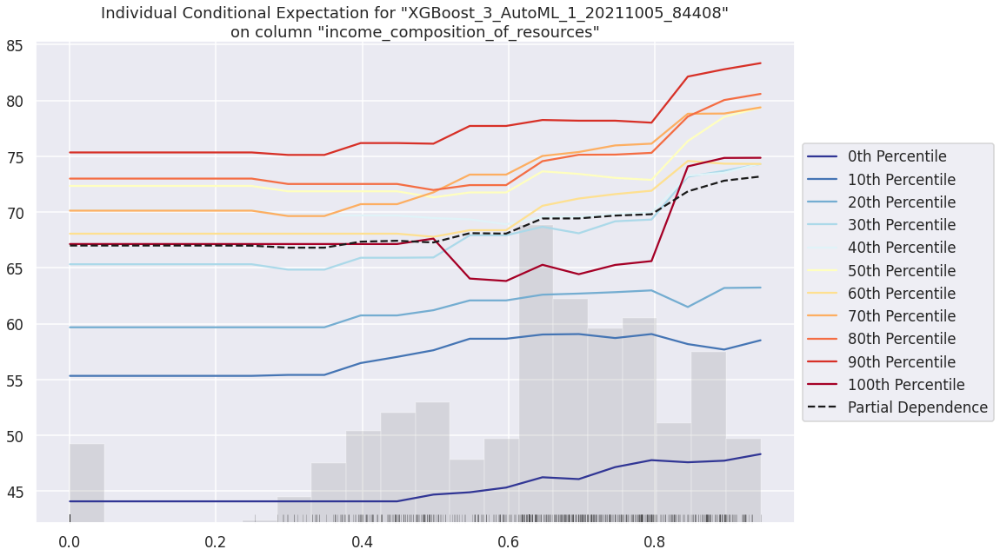

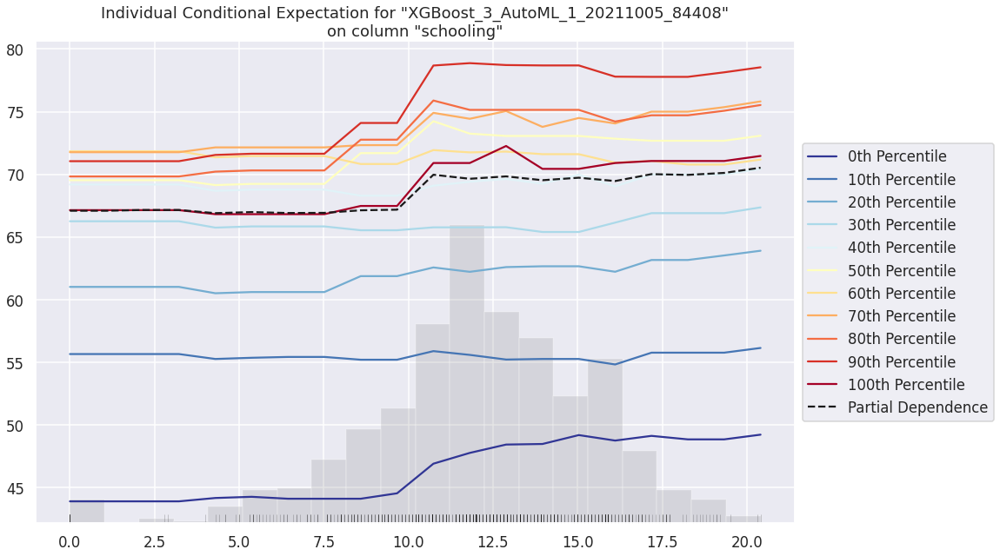

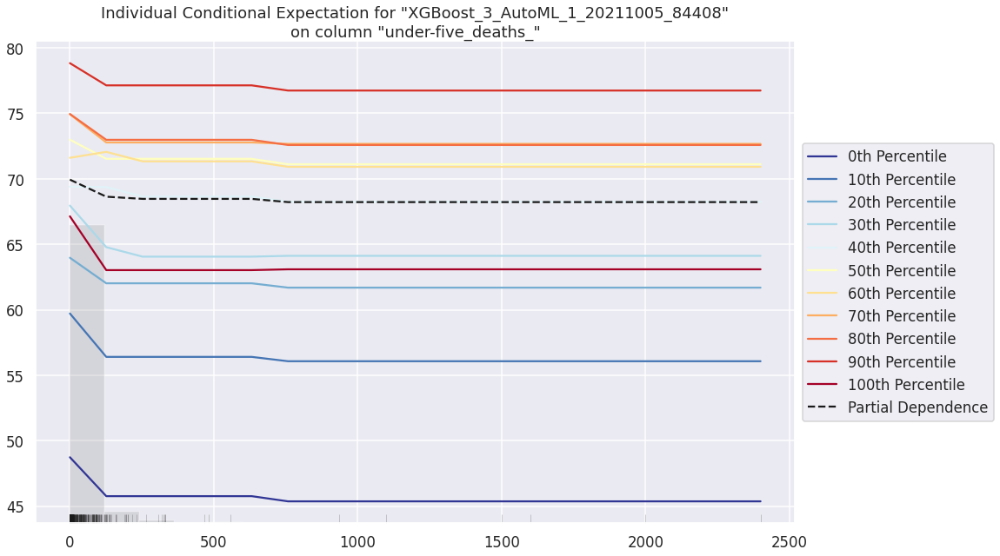

In [47]:
#explain a model
base_exm = base_model.explain(test)